# TVB-NEST: Bridging multiscale activity by co-simulation

## Step-by-step learn how to perform a co-simulation embedding spiking neural networks into large-scale brain networks using TVB.

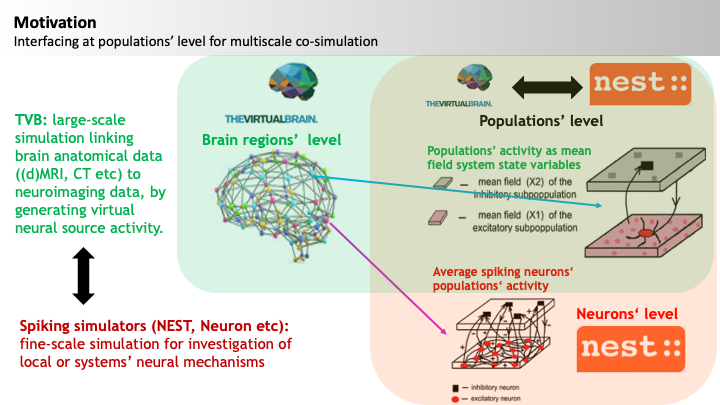

In [1]:
from IPython.core.display import Image, display
display(Image(filename='./ConceptGraph1.png',  width=1000, unconfined=False))

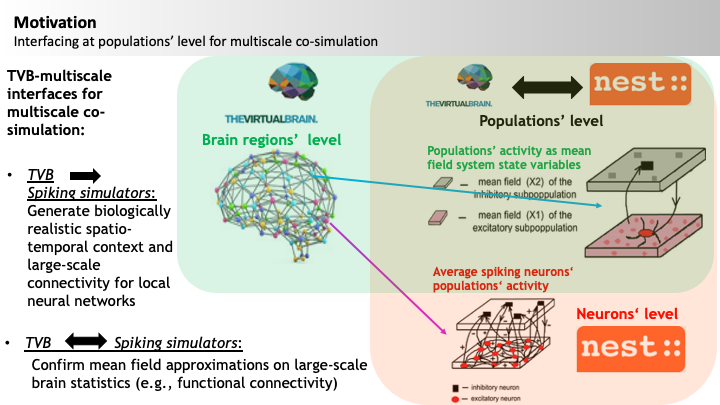

In [2]:
display(Image(filename='./ConceptGraph2.png',  width=1000, unconfined=False))

## tvb-multiscale toolbox:

### https://github.com/the-virtual-brain/tvb-multiscale

For questions use the git issue tracker, or write an e-mail to me: dionysios.perdikis@charite.de

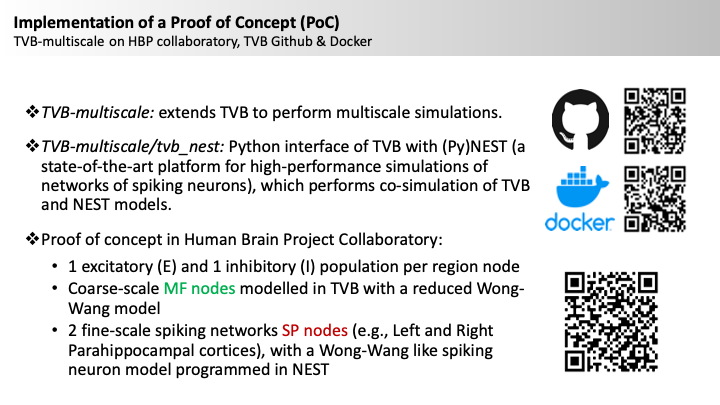

In [3]:
display(Image(filename='./Overview.png',  width=1000, unconfined=False))

### TVB - NEST co-simulation with Reduced Wong-Wang model

We demonstrate a multiscale simulation <br> of a reduced Wong-Wang model [3] <br> using TVB [1, 2] for brain region modelled at coarse scale, <br> and NEST [4] for regions modelled as <br> networks of spiking neural populations.

## Reduced Wong-Wang mean field model

For every region node $n\prime$ modelled as a mean-field node in TVB:

(Post)Synaptic gating dynamics (i.e., proportion of synapse channels open at any given time):

$\dot{S_{n\prime}}^{(E)} = - \frac{1}{\tau_E}{S_{n\prime}}^{(E)}(t) + (1-{S_{n\prime}}^{(E)}(t))\gamma_{E} {r_{n\prime}}^{(E)}(t)$

$\dot{S_{n\prime}}^{(I)} = - \frac{1}{\tau_I}{S_{n\prime}}^{(I)}(t) + \gamma_I{r_{n\prime}}^{(I)}(t)$

where we bound ${S_{n\prime}}^{(E/I)}(t) \in $ [0.0, 1.0], 

and $ {r_{n\prime}}^{(E/I)}(t) $ is the postsynaptic firing rate given by:

$ {r_{n\prime}}^{(E/I)}(t) = H({I_{syn_{n\prime}}}^{(E/I)}(t), a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) $

where

$ H({I_{syn_{n\prime}}}^{(E/I)}(t),  a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) = \frac{a_{(E/I)}{I_{syn_{n\prime}}}^{(E/I)}(t)-b_{(E/I)}}{1-e^{-d_{(E/I)}(a_{(E/I)}{I_{syn_{n\prime}}}^{(E/I)}(t)-b_{(E/I)})}}$ 

is a sigmoidal activation function of the input presynaptic current.

The total input presynaptic current to excitatory populations is given by: 

$ {I_{syn_{n\prime}}}^{(E)}(t) = W_EI_o + w_+J_{NMDA}{S_{n\prime}}^{(E)}(t) - J_{{n\prime}}{S_{n\prime}}^{(I)}(t) + GJ_{NMDA}\sum_{{m\prime}\neq {n\prime}}C_{{m\prime}{n\prime}}S_{m\prime}^{(E)}(t-\tau_{{m\prime}{n\prime}})$

and to inhibitory ones:

$ {I_{syn_{n\prime}}}^{(I)}(t) = W_II_o + J_{NMDA}{S_{n\prime}}^{(E)}(t) - {S_{n\prime}}^{(I)}(t) +  \lambda GJ_{NMDA}\sum_{{m\prime}\neq {n\prime}}C_{{m\prime}{n\prime}}S_{m\prime}^{(E)}(t-\tau_{{m\prime}{n\prime}})$

where 
$\lambda  \in$[0, 1] for scaling feedforward inhibition.

TVB connectivity weights $C_{{m\prime}{n\prime}}$ are scaled per "region"

## Reduced Wong-Wang mean field model

## Parameters following Ponce-Alvarez et al 2014:

- structural TVB connectivity weights $C_{{m\prime}{n\prime}}$ (${m\prime}->{n\prime}$)
- structural TVB connectivity delays $\tau_{{m\prime}{n\prime}}$  (${m\prime}->{n\prime}$)
- global structural brain connectivity coupling constant $G$
- overall effective external input current $I_o = 0.382nA$ 
- excitatory synaptic coupling $J_{NDMA} = 0.15nA$ 
- local feedback inhibitory synaptic coupling $J_{i} = 1.0nA$ 
- local excitatory recurrence $w_+ = 1.4$
- excitatory kinetic parameter $\gamma_E = 0.641 s$
- inhibitory kinetic parameter $\gamma_I = 1.0 s$
- excitatory (NMDA) time constant $\tau_E = \tau_{NMDA}=100ms$ 
- inhibitory (GABA) time constant $\tau_I = \tau_{GABA}=10ms$ 
- excitatory pool scaling constant $W_E = 1.0$
- inhibitory pool scaling constant $W_I = 0.7$
- excitatory sigmoidal functions parameters $a_{E} = 310nC^{-1}$, $b_{E} = 125Hz$, $d_{E} = 0.16s$
- inhibitory sigmoidal functions parameters $a_{I} = 615nC^{-1}$, $b_{I} = 177Hz$, $d_{I} = 0.087s$
- $\lambda = 1$, allowing for feedforward inhibition


## Spiking network model in NEST

For every neuron $i$ in region node $n$ modelled in NEST as a spiking network:


$ C_m{\dot{V}_{ni}}^m = - {I_{ni}}^L(t) - {I_{ni}}^{AMPA}(t) - {I_{ni}}^{NMDA}(t) - {I_{ni} ^{GABA}}(t)- {I_{ni}}^{AMPA,ext}(t)-G\sum_{n\prime n}C_{n\prime \neq n}{I_{n\prime n,i}}^{dc}(t-\tau_{n\prime n}) +{I_{ni}}^{ext}(t) $

$\;\;\;\;\;\;\;\;\;\;=-g_m({V_{ni}}^m(t) - V_L) $
              
$\;\;\;\;\;\;\;\;\;\;\;-g_{AMPA}({V_{ni}}^m(t) - V_E)w_E{S_{ni}}^{AMPA}(t) $

$\;\;\;\;\;\;\;\;\;\;\;-\frac{g_{NMDA}({V_{ni}}^m(t) - V_E)}{1+\lambda_{NMDA}e^{-\beta{V_{ni}}^m(t)}}w_E{S_{ni}}^{NMDA}(t) $

$\;\;\;\;\;\;\;\;\;\;\;-g_{GABA}({V_{ni}}^m(t) - V_I)w_I{S_{ni}}^{GABA}(t) $

$\;\;\;\;\;\;\;\;\;\;\;-g_{AMPA,ext}({V_{ni}}^m(t) - V_E)G\sum_{n\prime \neq n}C_{n\prime \neq n}{S_{n\prime \neq ni}}^{AMPA,ext}(t) $

$\;\;\;\;\;\;\;\;\;\;\;+{I_{ni}}^{ext}(t) $

$ {\dot{S}_{ni}}^{AMPA/GABA} = -\frac{1}{\tau_{AMPA/GABA,decay}}{S_{ni}}^{AMPA/GABA}(t) + \left[ \sum_{j=1,j \neq i}^{N_{E/I}} \sum_k \delta(t-{t_j}^k) \right]_{j \in n}$

$ {\dot{X}_{ni}}^{NMDA} = -\frac{1}{\tau_{NMDA,rise}}{X_{ni}}^{NMDA}(t) + \left[ \sum_{j=1,j \neq i}^{N_E} \sum_k \delta(t-{t_j}^k) \right]_{j \in n} $

$ {\dot{S}_{ni}}^{NMDA} = -\frac{1}{\tau_{NMDA,decay}}{S_{ni}}^{NMDA}(t) + \alpha {X_{ni}}^{NMDA}(t) (1 - \epsilon{S_{ni}}^{NMDA}(t)) $

$ {\dot{S}_{n\prime \neq ni}}^{AMPA,ext} = -\frac{1}{\tau_{AMPA,decay}}{S_{n\prime \neq ni}}^{AMPA,ext}(t) + \left[ \sum_{j=1}^{N_E} \sum_k \delta(t-\tau_{n\prime n}-{t_j}^k) \right]_{j \in n\prime, n\prime \neq n} $

Boundaries assuming that self-connections of neurons are not possible:

For excitatory neurons:

$ {S_{n,exc}}^{AMPA/NMDA}(t) \in [0.0, N_E-1]$

$ {S_{n,exc}}^{GABA}(t) \in [0.0, N_I]$

For inhibitory neurons:

$ {S_{n,inh}}^{AMPA/NMDA}(t) \in [0.0, N_E]$

$ {S_{n,inh}}^{GABA}(t) \in [0.0, N_I-1]$

For all neurons:

$ {S_{n,exc/inh}}^{AMPA,ext}(t) \in [0.0, N_E]$

When $V_m(t) > V_{th}$, emit a spike and clamp $V_m(t)$ to $V_{reset}$ for $\tau_{ref}$ ms.


## TVB to NEST coupling
The term 

$ G\sum_{n\prime n}C_{n\prime \neq n}{I_{n\prime n,i}}^{dc}(t-\tau_{n\prime n})$,

which is scaled by $\lambda$ for inhibitory neurons,

denotes possible inputs by NEST dc current generator devices that can play the role of TVB "proxy" nodes, i.e., mirroring their activity, where

$ I_{n\prime n,i}^{dc}(t) = N_EJ_{NMDA}{S_{n\prime}}^{(E)}(t) $

Similarly, $I_{ni}^{ext}(t)$ is an external current parameter that can be updated at each time step based on the TVB large-scale delayed coupling input towards region node n:

for excitatory neurons:

$I_{n,exc}^{ext}(t) = N_EGJ_{NMDA}\sum_{{n\prime} n}C_{{n\prime}}S_{n\prime}^{(E)}(t-\tau_{{n\prime}n})$

and for inhibitory ones:

$I_{n,inh}^{ext}(t) = N_E\lambda GJ_{NMDA}\sum_{{n\prime}n}C_{{n\prime}n}S_{n\prime}^{(E)}(t-\tau_{{n\prime}n})$

Instead, when TVB couples to NEST via instantaneous spike rate $ N_E{r_{n\prime}}^{(E/I)}(t) $, spike generator NEST devices are also used as TVB "proxy" nodes and generate spike trains 

$ \left[ \sum_k \delta(t-\tau_{n\prime n}-{t_j}^k) \right]_{j \in n\prime} $

Notice that all large-scale input is always scaled with the size of the excitatory population $ N_E $.

## NEST to TVB update

A NEST spike detector device is used to count spike for each time step, and convert it to an instant population mean rate that overrides the TVB state variables $r_e$ and $r_i$ after low pass filtering via a linear dynamical equation:

$ {\dot{r}_{n}}^{E/I}  = -\frac{1}{\tau_{rin_{n}}^{E/I}}({r_{n}}^{E/I}(t) - {r_{in_{n}}}^{E/I}(t)) $

where:

$ {r_{in_{n}}}^{E/I}(t) =  \frac{\sum_j\left[ \sum_k \delta(t-\tau_n-{t_j}^k) \right]_{j \in (E/I)_n}}{N_{(E/I)}} $

and $ \tau_{rin_{n}}^{E/I} = 1.0 ms $ by default


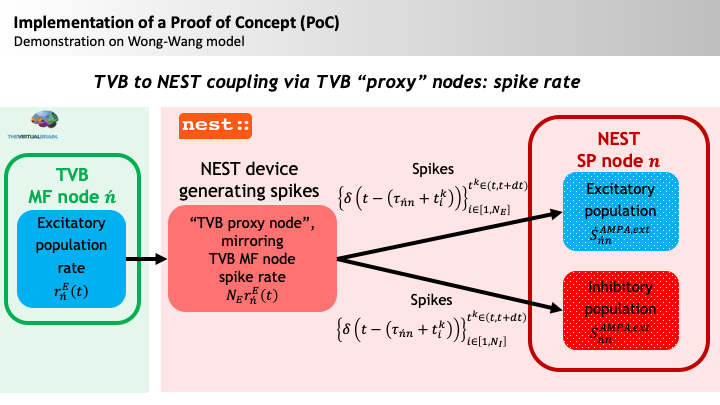

In [4]:
display(Image(filename='./Rate.png',  width=1000, unconfined=False))

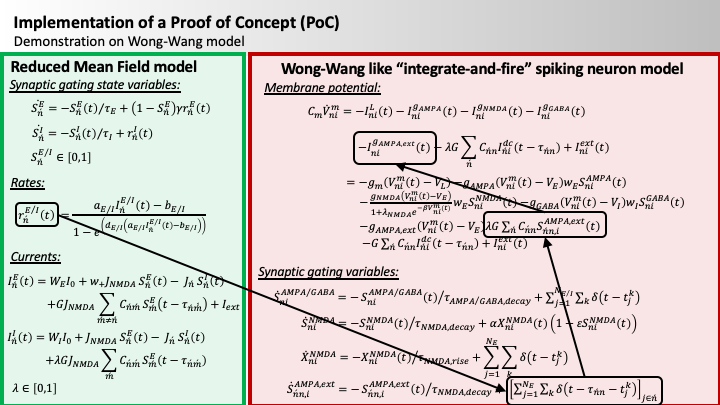

In [5]:
display(Image(filename='./Rate2.png',  width=1000, unconfined=False))

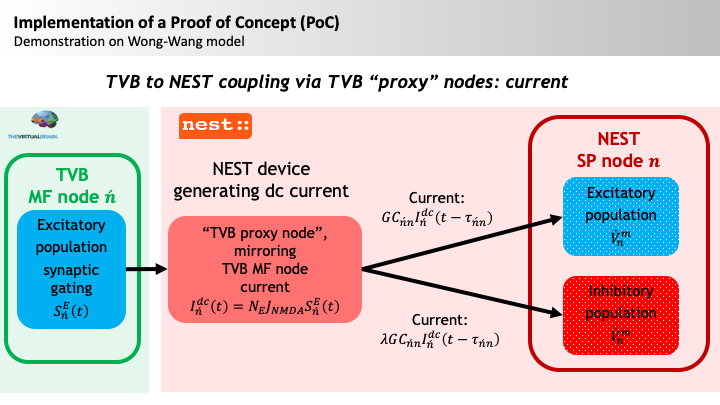

In [6]:
display(Image(filename='./DC.png',  width=1000, unconfined=False))

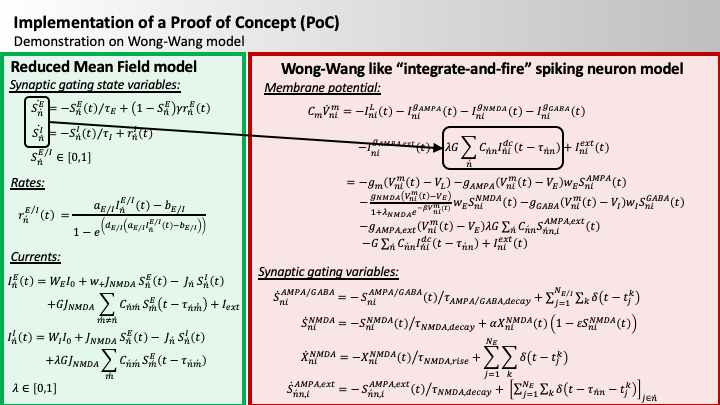

In [7]:
display(Image(filename='./DC2.png',  width=1000, unconfined=False))

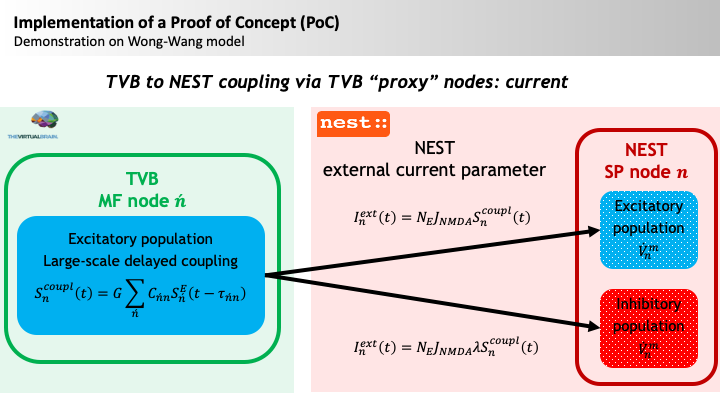

In [8]:
display(Image(filename='./Ie.png',  width=1000, unconfined=False))

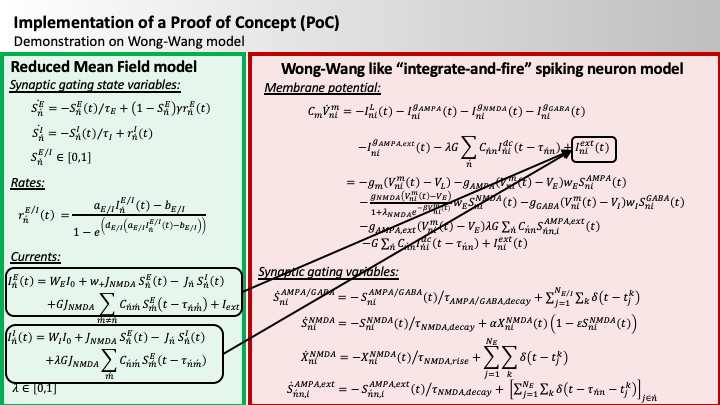

In [9]:
display(Image(filename='./Ie2.png',  width=1000, unconfined=False))

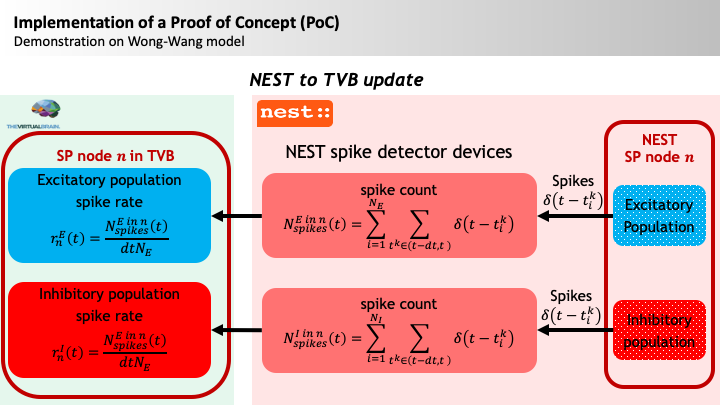

In [10]:
display(Image(filename='./NESTtoTVB.png',  width=1000, unconfined=False))

## Simulator loop

### Simulating several (i.e., 10) NEST time steps for every 1 TVB time step for stable integration

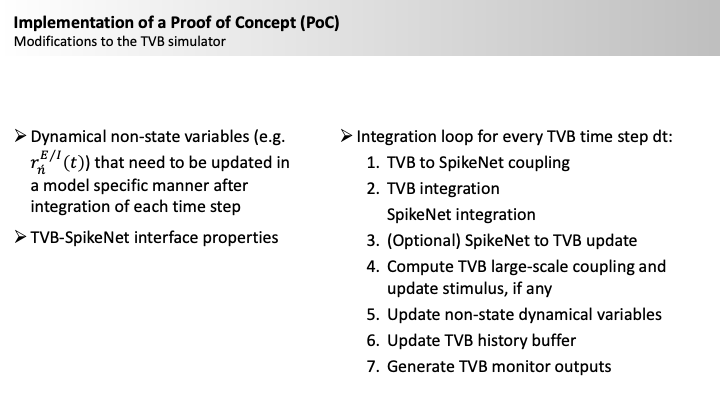

In [11]:
display(Image(filename='./simulator_loop.png',  width=10000, unconfined=False))

In [12]:
from collections import OrderedDict
import time
import numpy as np

from tvb.basic.profile import TvbProfile
TvbProfile.set_profile(TvbProfile.LIBRARY_PROFILE)

from tvb_nest.config import *
home_path = "/home/docker/packages/tvb-multiscale/docs/documented_example_notebook"
config = Config(output_base=os.path.join(home_path, "outputs_RedWongWang"))
config.figures.SHOW_FLAG = True 
config.figures.SAVE_FLAG = True
config.figures.FIG_FORMAT = 'png'
config.figures.DEFAULT_SIZE= config.figures.NOTEBOOK_SIZE
FIGSIZE = config.figures.DEFAULT_SIZE

from tvb_multiscale.plot.plotter import Plotter
plotter = Plotter(config.figures)

# For interactive plotting:
# %matplotlib notebook  

# Otherwise:
%matplotlib inline 
print(config.out.FOLDER_FIGURES)

/home/docker/packages/tvb-root/scientific_library/tvb/datatypes/surfaces.py:61: UserWarning: Geodesic distance module is unavailable; some functionality for surfaces will be unavailable.
  warnings.warn(msg)


2020-05-28 16:50:59,465 - WARNING - tvb.simulator.common - psutil module not available: no warnings will be issued when a
    simulation may require more memory than available
/home/docker/packages/tvb-multiscale/docs/documented_example_notebook/outputs_RedWongWang/figs


## 1. Load structural data <br> (minimally a TVB connectivity)  <br> & prepare TVB simulator  <br> (region mean field model, integrator, monitors etc)

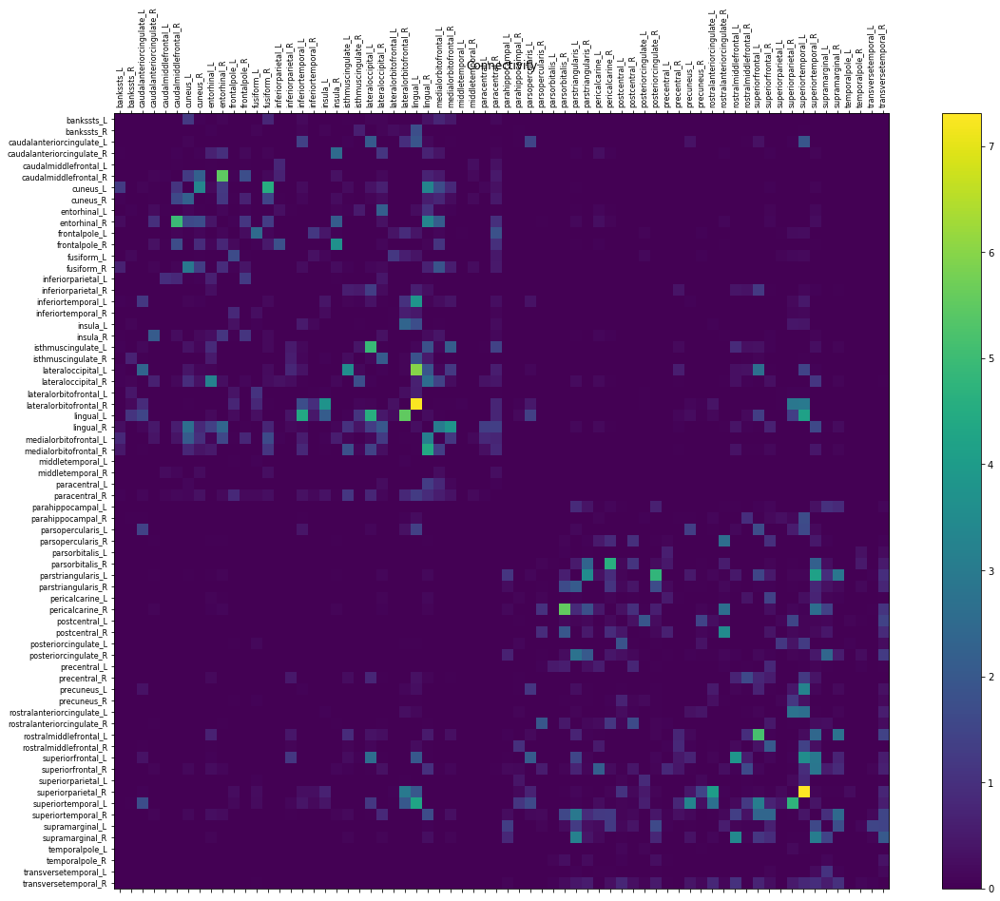

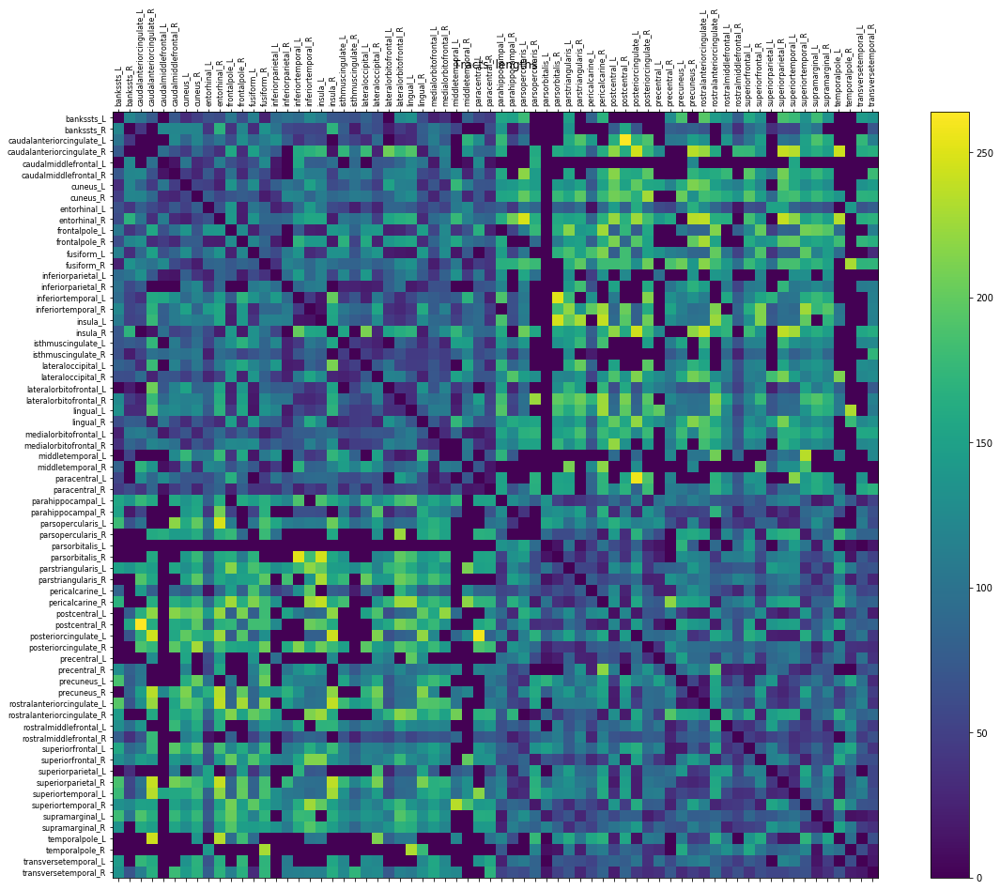

In [13]:
from tvb.simulator.models.reduced_wong_wang_exc_io_inh_i import ReducedWongWangExcIOInhI
from tvb_multiscale.tvb.simulator_builder import SimulatorBuilder



# ----------------------1. Build a TVB simulator (model, integrator, monitors...)----------------------------------
simulator_builder = SimulatorBuilder()
simulator_builder.connectivity = config.DEFAULT_CONNECTIVITY_ZIP
simulator_builder.model = ReducedWongWangExcIOInhI
model_params = {}  # {"G": np.array([2.0, ]), "J_i": np.array([1.0, ]), "lamda": np.array([0.0, ])}
simulator = simulator_builder.build(**model_params)


# Optionally modify the default configuration:

# # ----------------------------------------------------------------------------------------------------------------
# # ----Uncomment below to modify the simulator by changing the default options:--------------------------------------
# # ----------------------------------------------------------------------------------------------------------------

# from tvb.datatypes.connectivity import Connectivity
# from tvb.simulator.simulator import Simulator
# from tvb.simulator.integrators import HeunStochastic
# from tvb.simulator.monitors import Raw  # , Bold, EEG
    
# # Load connectivity
# connectivity = Connectivity.from_file(config.DEFAULT_CONNECTIVITY_ZIP)
# # Normalize connectivity weights
# connectivity.weights = connectivity.scaled_weights(mode="region")
# connectivity.weights /= np.percentile(connectivity.weights, 95)
# connectivity.configure()

# # Create a TVB simulator and set all desired inputs
# # (connectivity, model, surface, stimuli etc)
# # We choose all defaults in this example
# simulator = Simulator()
# simulator.model = ReducedWongWangExcIOInhI()
# # simulator.model.G = np.array([2.0, ])     # Global cloupling scaling
# # simulator.model.J_i = np.array([1.0, ])   # Feedback inhibition
# # simulator.model.lamda = np.array([0.0, ]) # Feedforward inhibition

# simulator.connectivity = connectivity

# simulator.integrator = HeunStochastic()
# simulator.integrator.dt = 0.1
# simulator.integrator.noise.nsig = np.array([0.001])

# mon_raw = Raw(period=1.0)  # ms
# simulator.monitors = (mon_raw, )

# # ----------------------------------------------------------------------------------------------------------------
# # ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# # ----------------------------------------------------------------------------------------------------------------

plotter.plot_tvb_connectivity(simulator.connectivity);


## 2. Build and connect the NEST network model <br> (networks of spiking neural populations for fine-scale <br>regions, stimulation devices, spike detectors etc)

In [14]:
# Select the regions for the fine scale modeling with NEST spiking networks
number_of_regions = simulator.connectivity.region_labels.shape[0]
nest_nodes_ids = []  # the indices of fine scale regions modeled with NEST
# We model parahippocampal cortices (left and right) with NEST
for id in range(number_of_regions):
    if simulator.connectivity.region_labels[id].find("hippo") > 0:
        nest_nodes_ids.append(id)
        
from tvb_nest.nest_models.builders.models.ww_deco2014 import WWDeco2014Builder

# Build a NEST network model with the corresponding builder
nest_model_builder = WWDeco2014Builder(simulator, nest_nodes_ids, config=config)


N_E = int(nest_model_builder.population_order * nest_model_builder.scale_e)
N_I = int(nest_model_builder.population_order * nest_model_builder.scale_i)


# Using all default parameters for this example


# or...

# # ----------------------------------------------------------------------------------------------------------------
# # ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# # ----------------------------------------------------------------------------------------------------------------

# population_neuron_model = "iaf_cond_deco2014"

# nest_model_builder.population_order = 100

# nest_model_builder.scale_e = 1.6
# nest_model_builder.scale_i = 0.4

# N_E = int(nest_model_builder.population_order * nest_model_builder.scale_e)
# N_I = int(nest_model_builder.population_order * nest_model_builder.scale_i)

# nest_model_builder.global_coupling_scaling = \
#     nest_model_builder.tvb_simulator.coupling.a[0].item() * nest_model_builder.tvb_model.G[0].item()
# nest_model_builder.lamda = nest_model_builder.tvb_model.lamda[0].item()


# # When any of the properties model, params and scale below depends on regions,
# # set a handle to a function with
# # arguments (region_index=None) returning the corresponding property

# def param_fun(node_index, params, weight):
#     w_E_ext = \
#         weight * nest_model_builder.tvb_weights[:, 
#                                                 list(nest_model_builder.spiking_nodes_ids).index(node_index)]
#     w_E_ext[node_index] = 1.0  # this is external input weight to this node
#     out_params = dict(params)
#     out_params.update({"w_E_ext": w_E_ext})
#     return out_params
    

# common_params = {
#     "V_th": -50.0, "V_reset": -55.0, "E_L": -70.0, "E_ex": 0.0, "E_in": -70.0,                       # mV
#     "tau_decay_AMPA": 2.0, "tau_decay_GABA_A": 10.0, "tau_decay_NMDA": 100.0, "tau_rise_NMDA": 2.0,  # ms
#     "s_AMPA_ext_max": N_E * np.ones((nest_model_builder.number_of_nodes,)).astype("f")
# }
# params_E = dict(common_params)
# params_E.update({
#     "C_m": 500.0,    # pF
#     "g_L": 25.0,     # nS
#     "t_ref": 2.0,    # ms
#     "g_AMPA_ext": 3.37, "g_AMPA": 0.065, "g_NMDA": 0.20, "g_GABA_A": 10.94,  # nS
#     "w_E": nest_model_builder.tvb_model.w_p[0].item(), 
#     "w_I": nest_model_builder.tvb_model.J_i[0].item(),
#     "N_E": N_E, "N_I": N_I
# })
# nest_model_builder.params_E = \
#     lambda node_index: param_fun(node_index, params_E,
#                                  weight=nest_model_builder.global_coupling_scaling)
# params_I = dict(common_params)
# params_I.update({
#     "C_m": 200.0,  # pF
#     "g_L": 20.0,   # nS
#     "t_ref": 1.0,  # ms
#     "g_AMPA_ext": 2.59, "g_AMPA": 0.051,"g_NMDA": 0.16, "g_GABA_A": 8.51,  # nS
#     "w_E": 1.0, "w_I": 1.0,
#     "N_E": N_E, "N_I": N_I
# })
# nest_model_builder.params_I = \
#     lambda node_index: param_fun(node_index, params_I,
#                                  weight=nest_model_builder.lamda * nest_model_builder.global_coupling_scaling)

# # Populations' configurations
# # When any of the properties model, params and scale below depends on regions,
# # set a handle to a function with
# # arguments (region_index=None) returning the corresponding property
# nest_model_builder.populations = [
#     {"label": "E", "model": population_neuron_model,
#      "nodes": None,  # None means "all"
#      "params": nest_model_builder.params_E,
#      "scale": nest_model_builder.scale_e},
#     {"label": "I", "model": population_neuron_model,
#      "nodes": None,  # None means "all"
#      "params": nest_model_builder.params_I,
#      "scale": nest_model_builder.scale_i}
#   ]

# # Within region-node connections
# # When any of the properties model, conn_spec, weight, delay, receptor_type below
# # set a handle to a function with
# # arguments (region_index=None) returning the corresponding property
# synapse_model = "static_synapse"
# conn_spec = {"autapses": True, 'multapses': True, 'rule': "all_to_all",
#              "indegree": None, "outdegree": None, "N": None, "p": 0.1}

# w_E = {"distribution": "normal", "mu": 1.0, "sigma": 0.1}
# w_I = {"distribution": "normal", "mu": -1.0, "sigma": 0.1}

# within_node_delay = {"distribution": "uniform", 
#                      "low": np.minimum(nest_model_builder.nest_instance.GetKernelStatus("min_delay"), 
#                                        nest_model_builder.default_populations_connection["delay"]), 
#                      "high": np.maximum(nest_model_builder.tvb_dt, 
#                                         2*nest_model_builder.default_populations_connection["delay"])}

# nest_model_builder.populations_connections = [
#      #              ->
#     {"source": "E", "target": "E",  # E -> E This is a self-connection for population "E"
#      "model": synapse_model, "conn_spec": conn_spec,
#      "weight": w_E, "delay": within_node_delay,
#      "receptor_type": 0, "nodes": None},  # None means apply to all
#     {"source": "E", "target": "I",  # E -> I
#      "model": synapse_model, "conn_spec": conn_spec,
#      "weight": w_E, "delay": within_node_delay,
#      "receptor_type": 0, "nodes": None},  # None means apply to all
#     {"source": "I", "target": "E",  # I -> E
#      "model": synapse_model, "conn_spec": conn_spec, 
#      "weight": w_I, "delay": within_node_delay,
#      "receptor_type": 0, "nodes": None},  # None means apply to all
#     {"source": "I", "target": "I",  # I -> I This is a self-connection for population "I"
#      "model": synapse_model, "conn_spec": conn_spec,
#      "weight": w_I, "delay": within_node_delay,
#      "receptor_type": 0, "nodes": None}  # None means apply to all
#     ]


# # Among/Between region-node connections
# # Given that only the AMPA population of one region-node couples to
# # all populations of another region-node,
# # we need only one connection type
        
# # When any of the properties model, conn_spec, weight, delay, receptor_type below
# # depends on regions, set a handle to a function with
# # arguments (source_region_index=None, target_region_index=None)

# from tvb_multiscale.spiking_models.builders.templates import  random_uniform_tvb_delay
    
# lamda = nest_model_builder.tvb_model.lamda[0]

# tvb_delay_fun = lambda source_node, target_node: \
#                  random_uniform_tvb_delay(source_node, target_node, nest_model_builder.tvb_delays, 
#                                           low=nest_model_builder.tvb_dt, 
#                                           high=2*nest_model_builder.tvb_dt, 
#                                           sigma=0.1)

# receptor_by_source_region = lambda source_node, target_node: int(source_node + 1)

# # Total excitatory spikes of one region node will be distributed to
# nest_model_builder.nodes_connections = [
#     #              ->
#     {"source": "E", "target": ["E"],
#      "model": synapse_model, "conn_spec": conn_spec,
#      "weight": w_E, "delay": tvb_delay_fun,  
#     # Each region emits spikes in its own port:
#      "receptor_type": receptor_by_source_region,
#      "source_nodes": None, "target_nodes": None}  # None means apply to all
#     ]

# if lamda > 0:
#     nest_model_builder.nodes_connections.append(
#         {"source": "E", "target": ["I"],
#          "model": synapse_model, "conn_spec": conn_spec,
#          "weight": w_E, "delay": tvb_delay_fun,  
#         # Each region emits spikes in its own port:
#          "receptor_type": receptor_by_source_region,
#          "source_nodes": None, "target_nodes": None}  # None means apply to all
#     )
    
    
# # Creating  devices to be able to observe NEST activity:

# nest_model_builder.output_devices = []

# connections = OrderedDict({})
# #          label <- target population
# connections["E"] = "E"
# connections["I"] = "I"
# nest_model_builder.output_devices.append(
#     {"model": "spike_detector", "params": {},
#      "connections": connections, "nodes": None})  # None means apply to all

# # Labels have to be different

# connections = OrderedDict({})
# #               label    <- target population
# connections["Excitatory"] = "E"
# connections["Inhibitory"] = "I"
# record_from = ["V_m",
#                "s_AMPA", "x_NMDA", "s_NMDA", "s_GABA",
#                "I_AMPA", "I_NMDA", "I_GABA", "I_L", "I_e",
#                "spikes_exc", "spikes_inh"]
# for i_node in range(nest_model_builder.number_of_nodes):
#     record_from.append("s_AMPA_ext_%d" % i_node)
#     record_from.append("I_AMPA_ext_%d" % i_node)
#     record_from.append("spikes_exc_ext_%d" % i_node)
# params = {"withtime": True, "withgid": True, 'record_from': record_from, "interval": 1.0}  # ms
# nest_model_builder.output_devices.append(
#     {"model": "multimeter", "params": params,
#      "connections": connections, "nodes": None})  # None means apply to all
    

# # Create a spike stimulus input device
# nest_model_builder.input_devices = [
#     {"model": "poisson_generator",
#      "params": {"rate": 2400.0, "origin": 0.0, "start": 0.1},  # "stop": 100.0
#      "connections": {"Stimulus": ["E", "I"]}, 
#      "nodes": None,         # None means apply to all
#      "weights": w_E, 
#      "delays": {"distribution": "uniform", 
#                 "low": nest_model_builder.tvb_dt, 
#                 "high": 2*nest_model_builder.tvb_dt},
#      "receptor_type": lambda target_node: int(target_node + 1)}
#                                   ]  #

# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

nest_network = nest_model_builder.build_spiking_network()


2020-05-28 16:51:07,904 - INFO - tvb_nest.nest_models.builders.base - Loading a NEST instance...
2020-05-28 16:51:07,904 - INFO - tvb_nest.nest_models.builders.base - Loading a NEST instance...
2020-05-28 16:51:07,906 - INFO - tvb_nest.nest_models.builders.base - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2020-05-28 16:51:07,906 - INFO - tvb_nest.nest_models.builders.base - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2020-05-28 16:51:07,908 - INFO - tvb_nest.nest_models.builders.base - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2020-05-28 16:51:07,908 - INFO - tvb_nest.nest_models.builders.base - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2020-05-28 16:51:07,911 - INFO - tvb_nest.nest_models.builders.base - NEST_DOC_DIR: /home/docker/env/neurosci/nest_build/share/doc/nest
2020-05-28 16:51:07,911 - INFO - tvb_nest.nest_models.builders.base - NEST_DOC_DIR: /home/docker/env/neurosci/nest_build/share/doc/nest
2020-05-28 16:51:0

2020-05-28 16:51:09,039 - INFO - tvb_nest.nest_models.builders.nest_factory - from in build_interfaces directory /home/docker/packages/tvb-multiscale/tvb_nest/nest/modules_builds/iaf_cond_deco2014...
2020-05-28 16:51:09,043 - INFO - tvb_nest.nest_models.builders.nest_factory - Running compilation...
2020-05-28 16:51:09,043 - INFO - tvb_nest.nest_models.builders.nest_factory - Running compilation...
2020-05-28 16:51:14,910 - WARNING - tvb_nest.nest_models.builders.nest_factory - Something seems to have gone wrong with compiling iaf_cond_deco2014!
2020-05-28 16:51:14,910 - WARNING - tvb_nest.nest_models.builders.nest_factory - Something seems to have gone wrong with compiling iaf_cond_deco2014!
2020-05-28 16:51:14,912 - INFO - tvb_nest.nest_models.builders.base - Installing now module iaf_cond_deco2014module...
2020-05-28 16:51:14,912 - INFO - tvb_nest.nest_models.builders.base - Installing now module iaf_cond_deco2014module...
2020-05-28 16:51:14,922 - INFO - tvb_nest.nest_models.builde

## 3. Build the TVB-NEST interface

In [15]:
from tvb_nest.interfaces.builders.models.red_ww_exc_io_inh_i import \
    RedWWexcIOinhIBuilder as InterfaceRedWWexcIOinhIBuilder

# Build a TVB-NEST interface with all the appropriate connections between the
# TVB and NEST modelled regions
tvb_nest_builder = \
    InterfaceRedWWexcIOinhIBuilder(simulator, nest_network, nest_nodes_ids, 
                                   exclusive_nodes=True, N_E=N_E, N_I=N_I)

tvb_to_nest_mode="rate"
nest_to_tvb=True

# Using all default parameters for this example

# or...


# # ----------------------------------------------------------------------------------------------------------------
# # ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# # ----------------------------------------------------------------------------------------------------------------

# from tvb_multiscale.spiking_models.builders.templates \
#     import random_normal_tvb_weight, random_uniform_tvb_delay, receptor_by_source_region

# lamda = tvb_nest_builder.tvb_model.lamda[0].item()
# G = tvb_nest_builder.tvb_model.G[0].item()
# tvb_nest_builder.global_coupling_scaling = G * tvb_nest_builder.tvb_simulator.coupling.a[0].item()


# # TVB -> NEST

# if tvb_to_nest_mode in ["rate", "current"]:

#     tvb_delay_fun = lambda tvb_node_id, nest_node_id: \
#                         random_uniform_tvb_delay(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_delays,
#                                                  low=tvb_nest_builder.tvb_dt, 
#                                                  high=2*tvb_nest_builder.tvb_dt,
#                                                  sigma=0.1)

# # --------For spike transmission from TVB to NEST devices acting as TVB proxy nodes with TVB delays:--------

# # Mean spike rates are applied in parallel to all target neurons

# if tvb_to_nest_mode == "rate":
#     weights = {"distribution": "normal", "mu": 1.0, "sigma": 0.1}
#     receptor_by_source_region = lambda source_node, target_node: int(source_node + 1)
    
#     tvb_nest_builder.tvb_to_nest_interfaces = [
#         {"model": "inhomogeneous_poisson_generator",
#          "params": {"allow_offgrid_times": False},
#     # # ---------Properties potentially set as function handles with args (nest_node_id=None)-------------------------
#          "interface_weights": 1.0 * N_E, # Convert mean value to total value
#     # Applied outside NEST for each interface device
#     # -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
#         "weights": weights, "delays": tvb_delay_fun,
#         "receptor_type": receptor_by_source_region,
#         # --------------------------------------------------------------------------------------------------------------
#         #             TVB sv -> NEST population
#         "connections": {"R_e": ["E"]},
#         "source_nodes": None, "target_nodes": None}]  # None means all here

#     if lamda > 0.0:
#         tvb_nest_builder.tvb_to_nest_interfaces.append(
#             {"model": "inhomogeneous_poisson_generator",
#              "params": {"allow_offgrid_times": False},
#         # # ---------Properties potentially set as function handles with args (nest_node_id=None)-------------------------
#              "interface_weights": 1.0 * N_E, # Convert mean value to total value
#         # Applied outside NEST for each interface device
#         # -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
#             "weights": weights, "delays": tvb_delay_fun,
#             "receptor_type": receptor_by_source_region,
#             # --------------------------------------------------------------------------------------------------------------
#             #             TVB sv -> NEST population
#             "connections": {"R_e": ["I"]},
#             "source_nodes": None, "target_nodes": None
#             }
#         )


    
# # Mean currents are distributed to all target neurons


# if tvb_to_nest_mode == "current":
    
#     tvb_weight_fun = \
#         lambda tvb_node_id, nest_node_id: \
#             random_normal_tvb_weight(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_weights, 
#                                      scale=tvb_nest_builder.global_coupling_scaling, sigma=0.1)

#     # --------For injecting current to NEST neurons via dc generators acting as TVB proxy nodes with TVB delays:--------

#     tvb_nest_builder.tvb_to_nest_interfaces = [
#         {"model": "dc_generator", "params": {},
#     # Properties potentially set as function handles with args (nest_node_id=None)
#     #   Applied outside NEST for each interface device
#          "interface_weights": 1.0,  # N_E / N_E
#     # Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)
#          "weights": tvb_weight_fun,
#          "delays": tvb_delay_fun,
#     #                   TVB sv -> NEST population
#          "connections": {"S_e": ["E"]},
#          "source_nodes": None, "target_nodes": None}]  # None means all here

#     if lamda > 0.0:
#         tvb_nest_builder.tvb_to_nest_interfaces.append(
#            {"model": "dc_generator", "params": {},
#         # ---------Properties potentially set as function handles with args (nest_node_id=None)
#         #   Applied outside NEST for each interface device
#              "interface_weights": lamda * N_E / N_I,
#         # Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)
#              "weights": tvb_weight_fun,
#              "delays": tvb_delay_fun,
#         #                  TVB sv -> NEST population
#              "connections": {"S_e": ["I"]},
#              "source_nodes": None, "target_nodes": None}
#         )


# if tvb_to_nest_mode == "param":

#     # --------For directly setting an external current parameter in NEST neurons instantaneously:--------
#     tvb_nest_builder.tvb_to_nest_interfaces = [
#         {"model": "current",  "parameter": "I_e",
#     # Properties potentially set as function handles with args (nest_node_id=None)
#          "interface_weights": G,  # N_E / N_E
#     #                  TVB sv -> NEST population
#          "connections": {"S_e": ["E"]},
#          "nodes": None}]  # None means all here
#     if lamda > 0.0:
#         # Coupling to inhibitory populations as well (feedforward inhibition):
#         tvb_nest_builder.tvb_to_spikeNet_interfaces.append(
#         {
#             "model": "current", "parameter": "I_e",
#     # Properties potentially set as function handles with args (nest_node_id=None
#             "interface_weights": lamda * G * N_E / N_I,
#     #                     TVB sv -> NEST population
#             "connections": {"S_e": ["I"]},
#             "nodes": None}
#     )

    

# if nest_to_tvb:
#     # NEST -> TVB:
#     # Use S_e and S_i instead of r_e and r_i
#     # for transmitting to the TVB state variables directly
#     connections = OrderedDict()
#     #            TVB <- NEST
#     connections["Rin_e"] = ["E"]
#     connections["Rin_i"] = ["I"]
#     tvb_nest_builder.nest_to_tvb_interfaces = [
#         {"model": "spike_detector", "params": {},
#     # ------------------Properties potentially set as function handles with args (nest_node_id=None)--------------------
#          "weights": 1.0, "delays": 0.0,
#     # -----------------------------------------------------------------------------------------------------------------
#          "connections": connections, "nodes": None}]  # None means all here

    
# tvb_nest_builder.w_tvb_to_current = 1000 * tvb_nest_builder.tvb_model.J_N[0]  # (nA of TVB -> pA of NEST)
# # WongWang model parameter r is in Hz, just like poisson_generator assumes in NEST:
# tvb_nest_builder.w_tvb_to_spike_rate = 1.0
# # We return from a NEST spike_detector the ratio number_of_population_spikes / number_of_population_neurons
# # for every TVB time step, which is usually a quantity in the range [0.0, 1.0],
# # as long as a neuron cannot fire twice during a TVB time step, i.e.,
# # as long as the TVB time step (usually 0.001 to 0.1 ms)
# # is smaller than the neurons' refractory time, t_ref (usually 1-2 ms)
# # For conversion to a rate, one has to do:
# # w_spikes_to_tvb = 1/tvb_dt, to get it in spikes/ms, and
# # w_spikes_to_tvb = 1000/tvb_dt, to get it in Hz
# # given WongWang model parameter r is in Hz but tvb dt is in ms:
# tvb_nest_builder.w_spikes_to_tvb = 1000.0 / tvb_nest_builder.tvb_dt
# # ----------------------------------------------------------------------------------------------------------------
# # ----------------------------------------------------------------------------------------------------------------
# # ----------------------------------------------------------------------------------------------------------------

tvb_nest_model = tvb_nest_builder.build_interface(tvb_to_nest_mode=tvb_to_nest_mode, nest_to_tvb=nest_to_tvb)

2020-05-28 16:51:15,964 - INFO - tvb_multiscale.interfaces.base - <class 'tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2020-05-28 16:51:15,964 - INFO - tvb_multiscale.interfaces.base - <class 'tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2020-05-28 16:51:15,965 - INFO - tvb_nest.interfaces.models - <class 'tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2020-05-28 16:51:15,965 - INFO - tvb_nest.interfaces.models - <class 'tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2020-05-28 16:51:15,971 - INFO - tvb_multiscale.spiking_models.devices - <class 'tvb_multiscale.spiking_models.devices.DeviceSet'> of model inhomogeneous_poisson_generator for R_e created!
2020-05-28 16:51:15,971 - INFO - tvb_multiscale.spiking_models.devices - <class 'tvb_multiscale.spiking_models.devices.DeviceSet'> of model inhomogeneous_poisson_generator for R_e created!
2020-05-28 16:51:16,168 - INFO - tvb_multiscale.spiking_models.devices - <class 'tvb_nest.interfaces.tvb_to_nest_devices_i

## 4. Configure simulator, simulate, gather results

In [16]:
# Configure the simulator with the TVB-NEST interface...
simulator.configure(tvb_spikeNet_interface=tvb_nest_model)
# ...and simulate!
t = time.time()
results = simulator.run(simulation_length=1100.0)
# Integrate NEST one more NEST time step so that multimeters get the last time point
# unless you plan to continue simulation later
simulator.run_spiking_simulator(simulator.tvb_spikeNet_interface.nest_instance.GetKernelStatus("resolution"))
print("\nSimulated in %f secs!" % (time.time() - t))

...100.0% done in 480.2 sec
Simulated in 480.527374 secs!


In [17]:
# Clean-up NEST simulation
simulator.tvb_spikeNet_interface.nest_instance.Cleanup()

## 5. Plot results and write them to HDF5 files

In [18]:
# from tvb_multiscale.examples.plot_write_results import plot_write_results
# plot_write_results(results, simulator, [N_E, N_I], transient=10.0, tvb_state_variable_type_label="State Variables",
#                    tvb_state_variables_labels=simulator.model.variables_of_interest, plotter=plotter, config=config)

In [19]:
# If you want to see what the function above does, take the steps, one by one
try:
    # We need framework_tvb for writing and reading from HDF5 files
    from tvb_multiscale.io.h5_writer import H5Writer
    writer = H5Writer()
except:
    writer = False
    
from tvb.contrib.scripts.datatypes.time_series import TimeSeriesRegion
from tvb.contrib.scripts.datatypes.time_series_xarray import TimeSeriesRegion as TimeSeriesXarray

# Put the results in a Timeseries instance
from tvb.contrib.scripts.datatypes.time_series import TimeSeriesRegion

source_ts = TimeSeriesXarray(  # substitute with TimeSeriesRegion fot TVB like functionality
        data=results[0][1], time=results[0][0],
        connectivity=simulator.connectivity,
        labels_ordering=["Time", "State Variable", "Region", "Neurons"],
        labels_dimensions={"State Variable": list(simulator.model.variables_of_interest),
                           "Region": simulator.connectivity.region_labels.tolist()},
        sample_period=simulator.integrator.dt)
source_ts.configure()

# Remove transient, if any
transient = 100.0
if transient:
    source_ts = source_ts[transient:]
    exclude_times = [0.0, transient]
else:
    exclude_times = []
t = source_ts.time
    
# Write to file
if writer:
    writer.write_tvb_to_h5(TimeSeriesRegion().from_xarray_DataArray(source_ts._data,
                                                                    connectivity=source_ts.connectivity),
                           os.path.join(config.out.FOLDER_RES, source_ts.title)+".h5")
source_ts

,value
Dimensions,"['Time', 'State Variable', 'Region', 'Neurons']"
Length,10001
Region Mapping,None
Region Mapping Volume,None
Sample period,0.1
Source Connectivity,Connectivity gid: 6d177d87-7659-45bf-bde3-b63a66e958ec
Time units,ms
Time-series name,Region Time Series
Time-series type,TimeSeriesRegion
"[min, median, max]","[-0.192924, 0.347434, 500]"


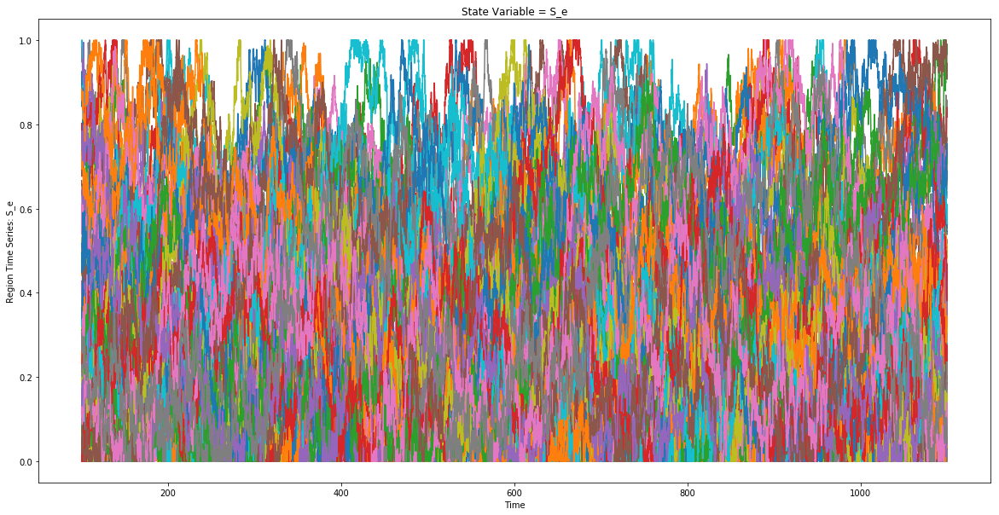

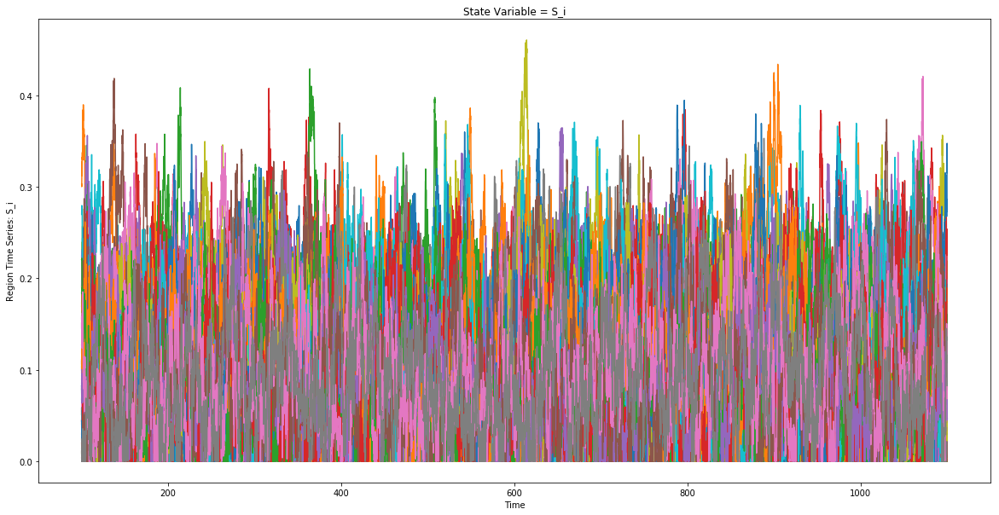

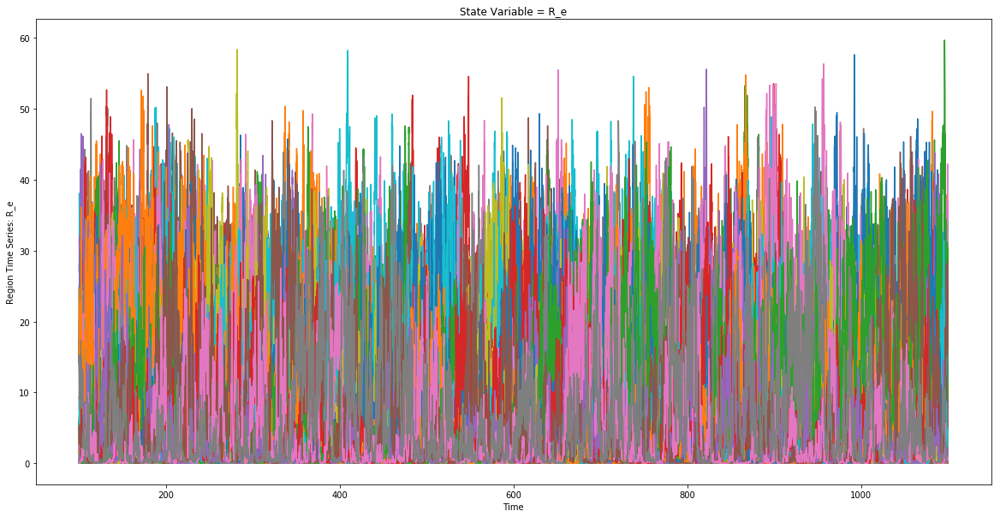

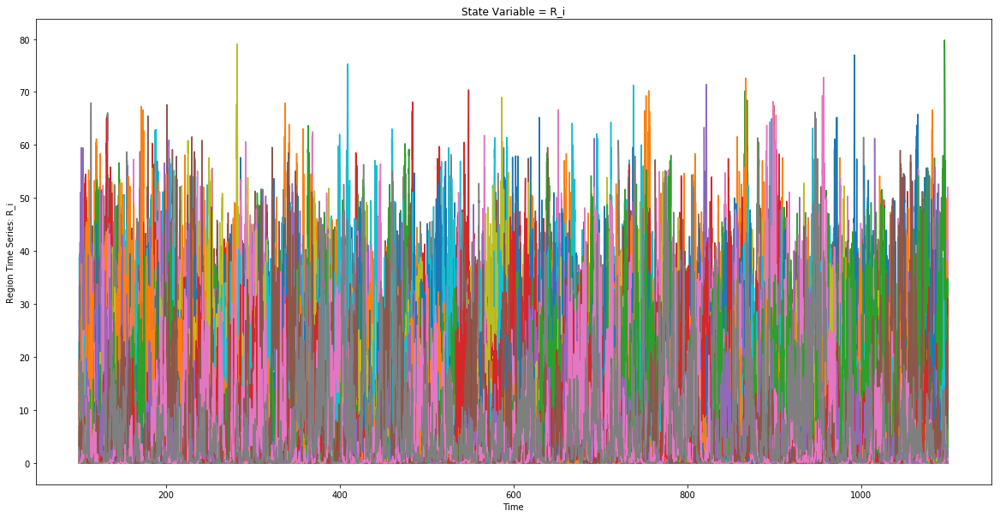

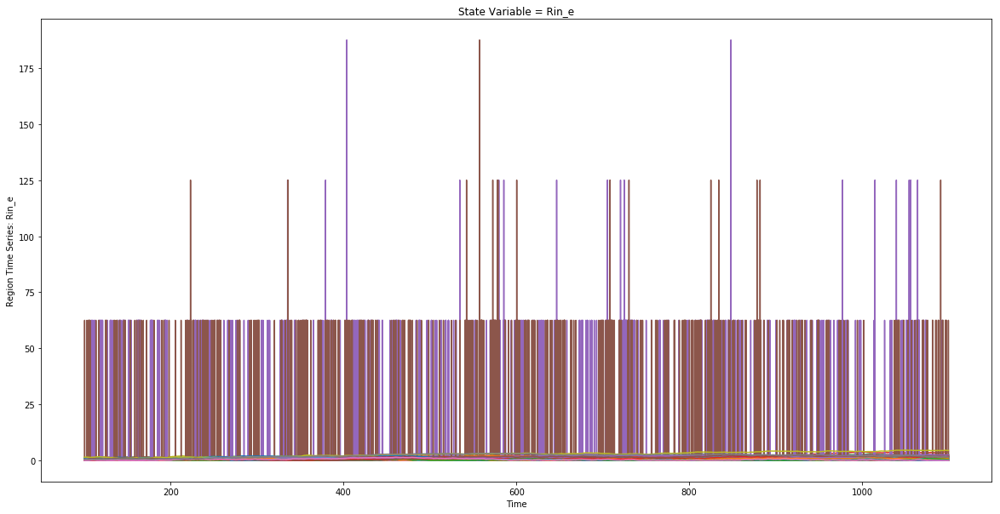

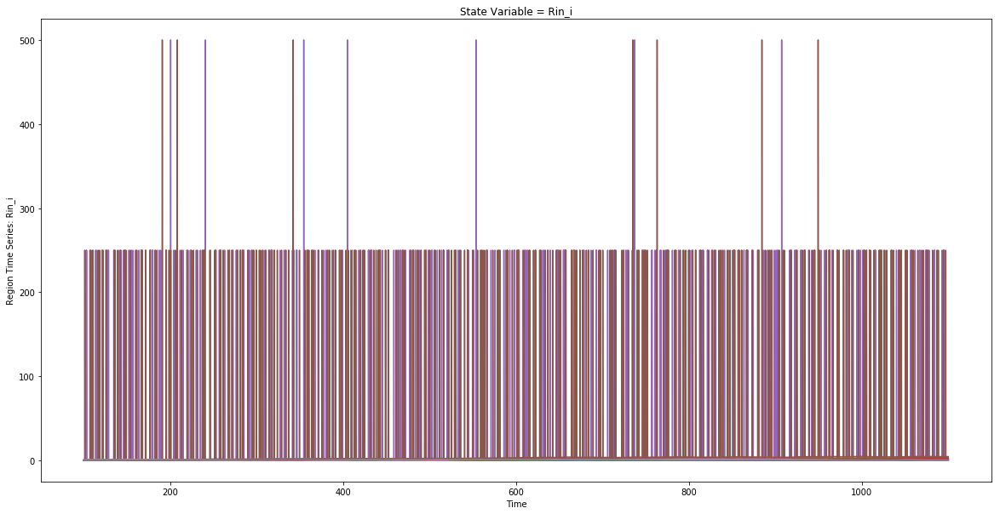

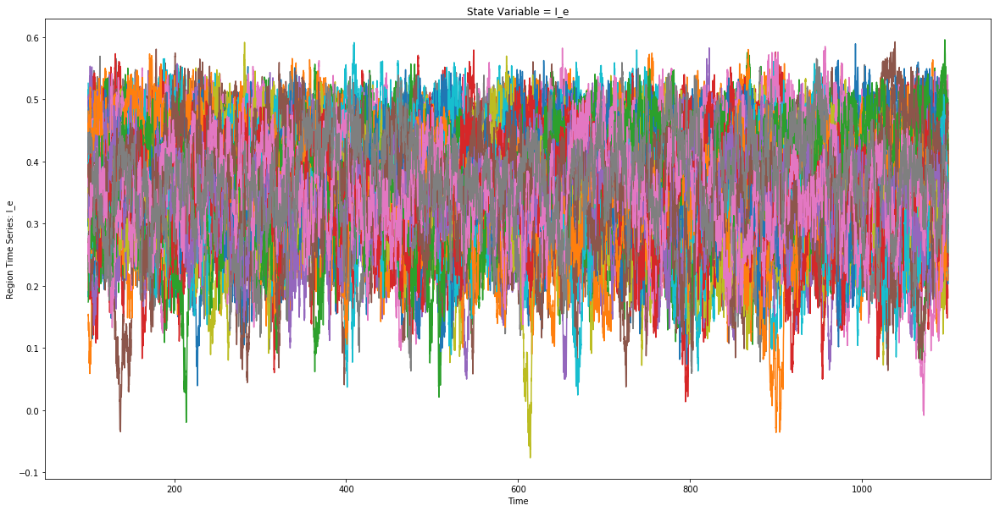

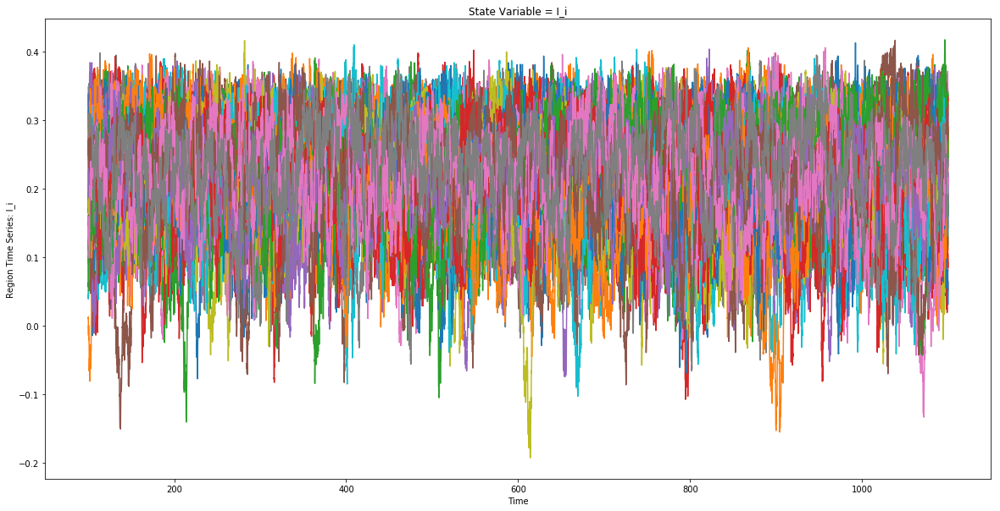

In [20]:
# Plot TVB time series
source_ts.plot_timeseries(plotter_config=plotter.config, per_variable=True, figsize=FIGSIZE, add_legend=False);

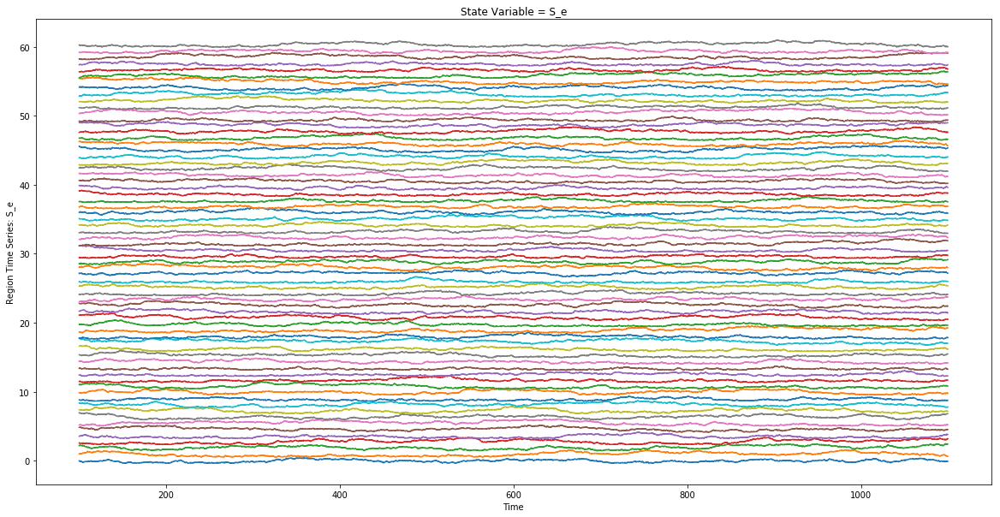

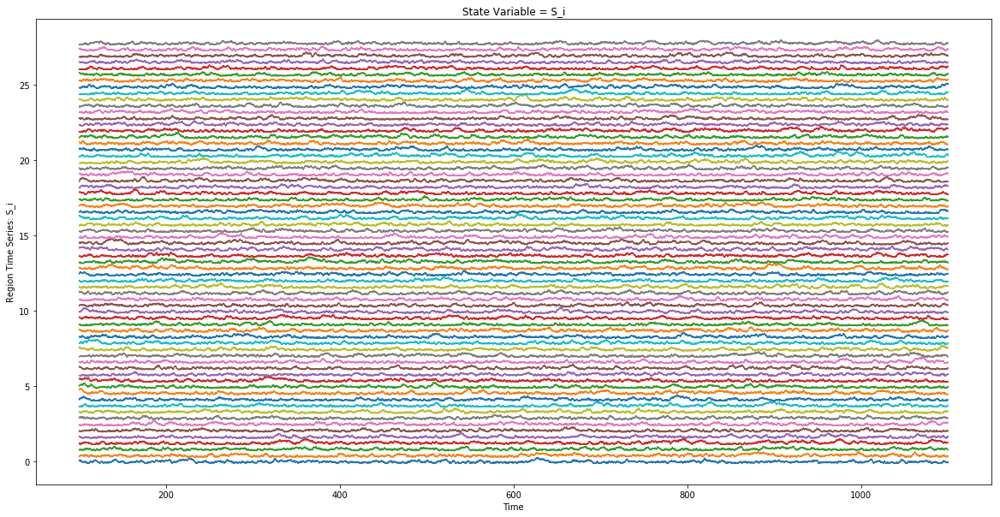

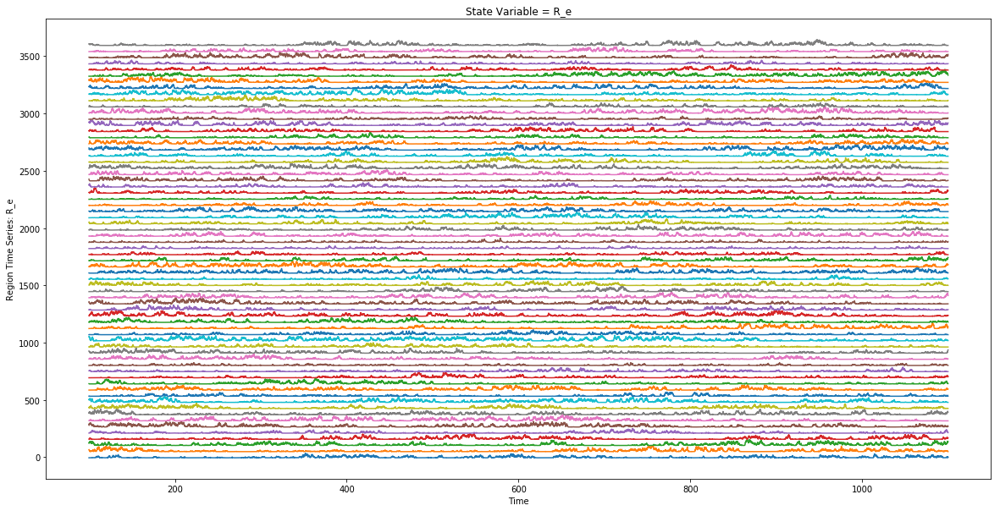

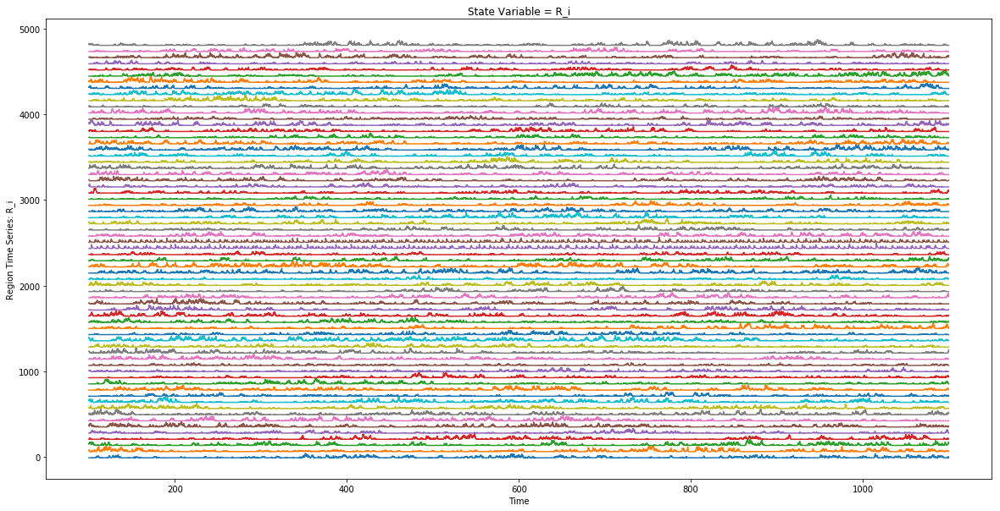

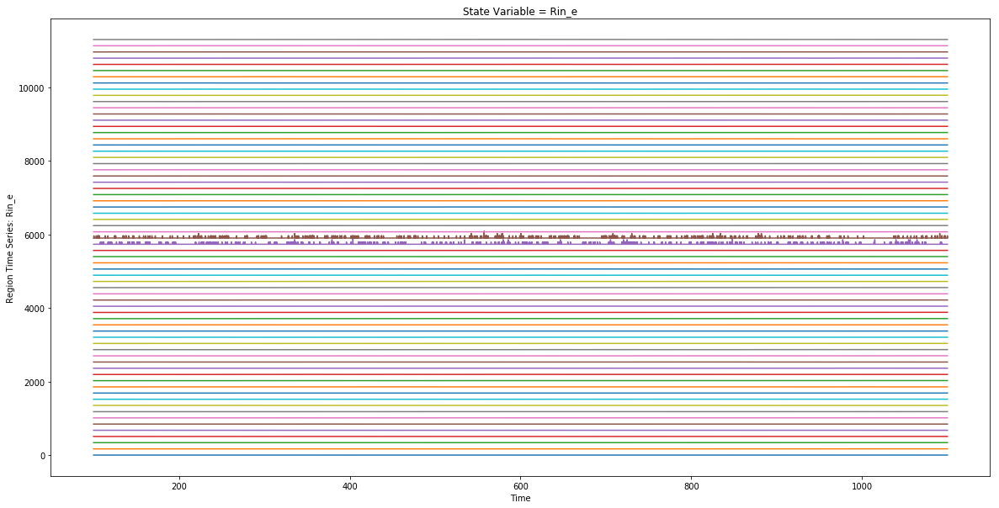

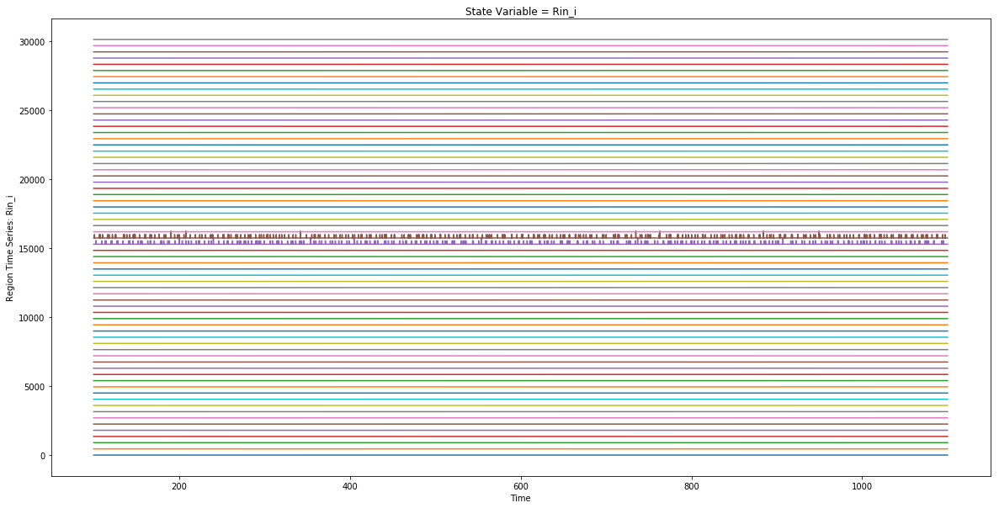

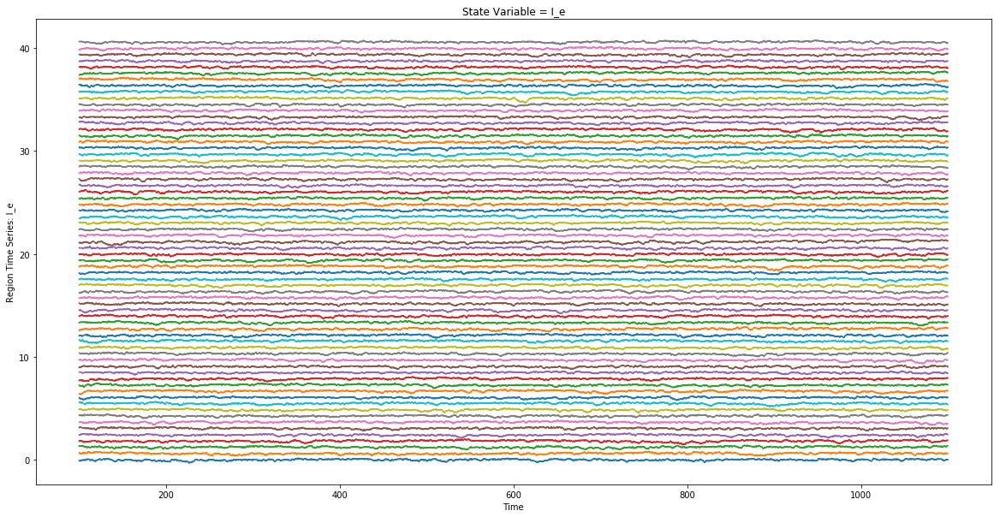

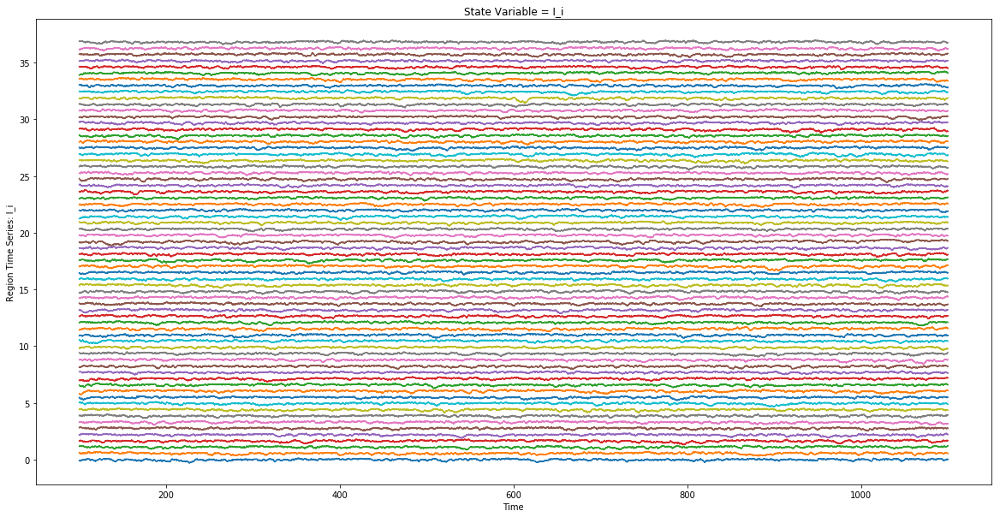

In [21]:
# TVB time series raster plot:
if source_ts.number_of_labels > 9:
    source_ts.plot_raster(plotter_config=plotter.config, per_variable=True, figsize=FIGSIZE, add_legend=False);

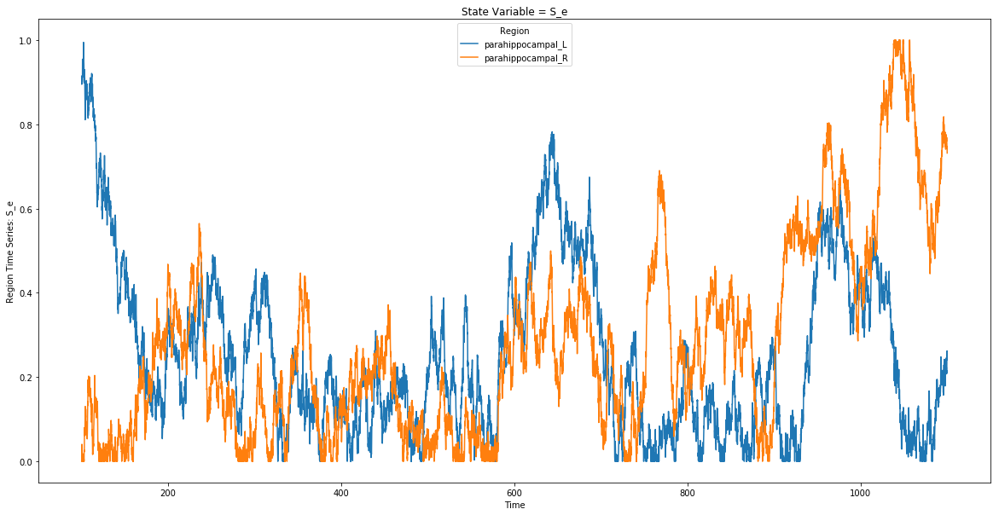

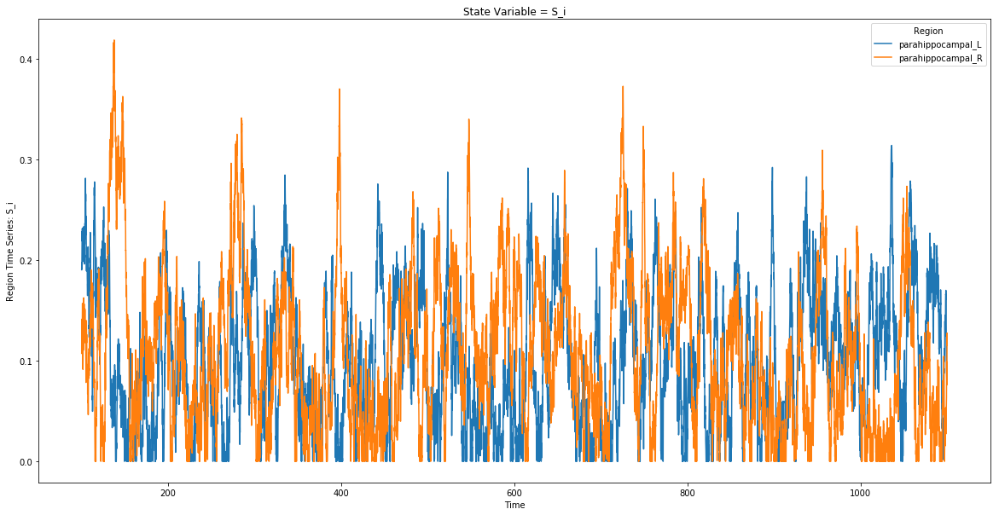

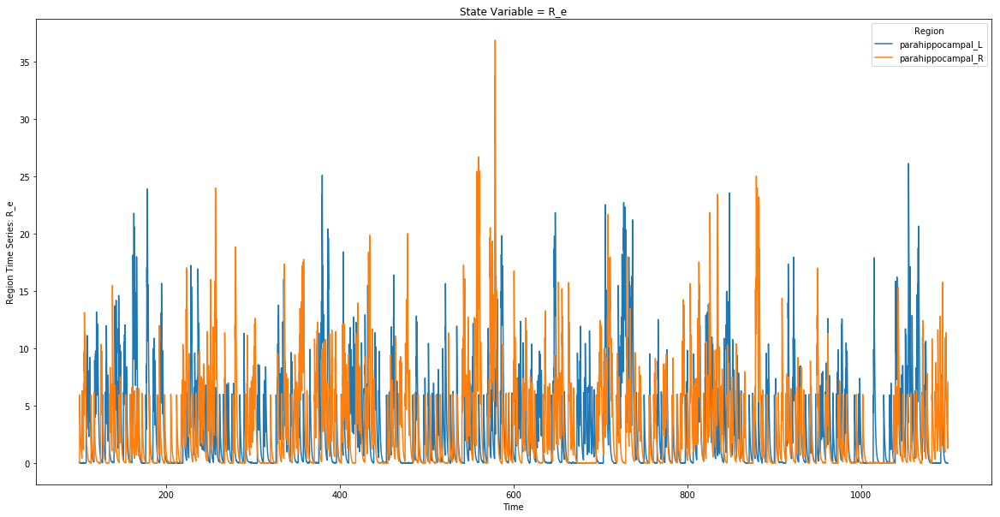

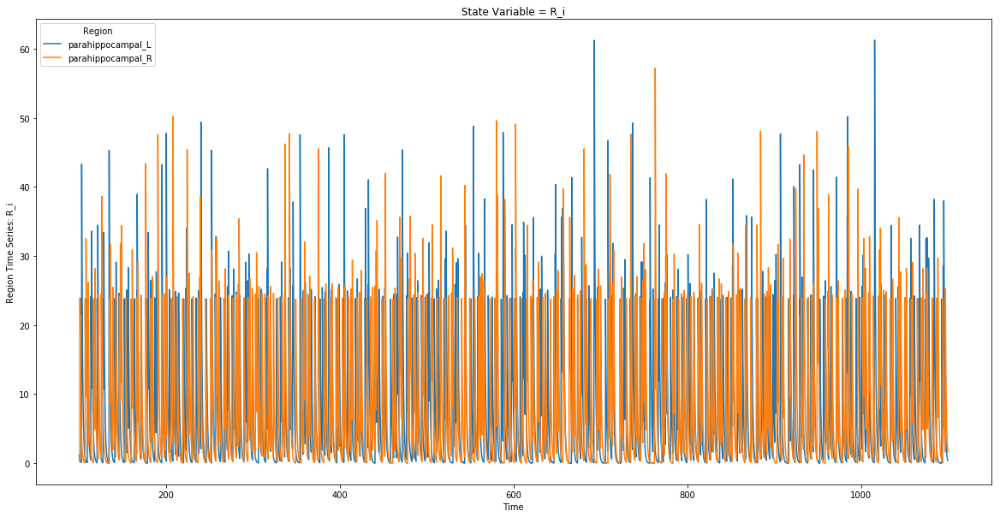

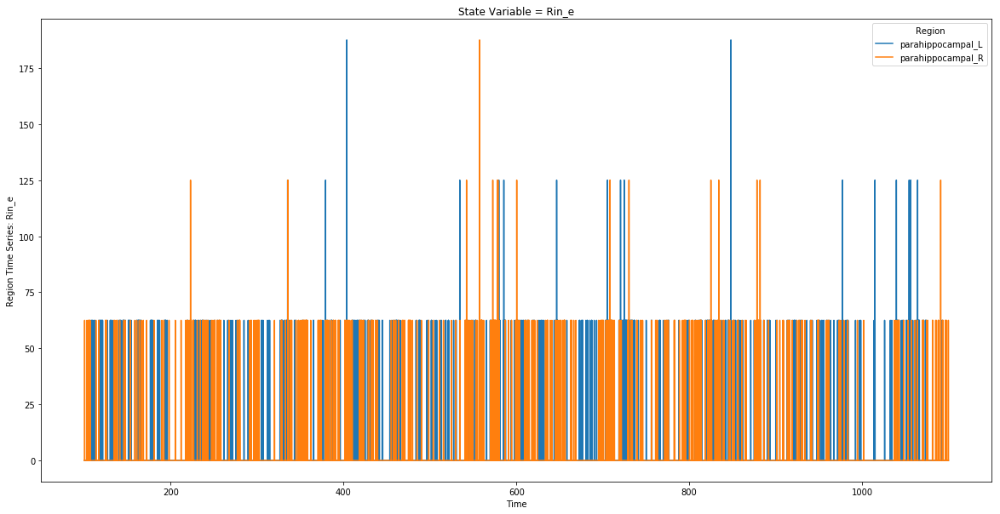

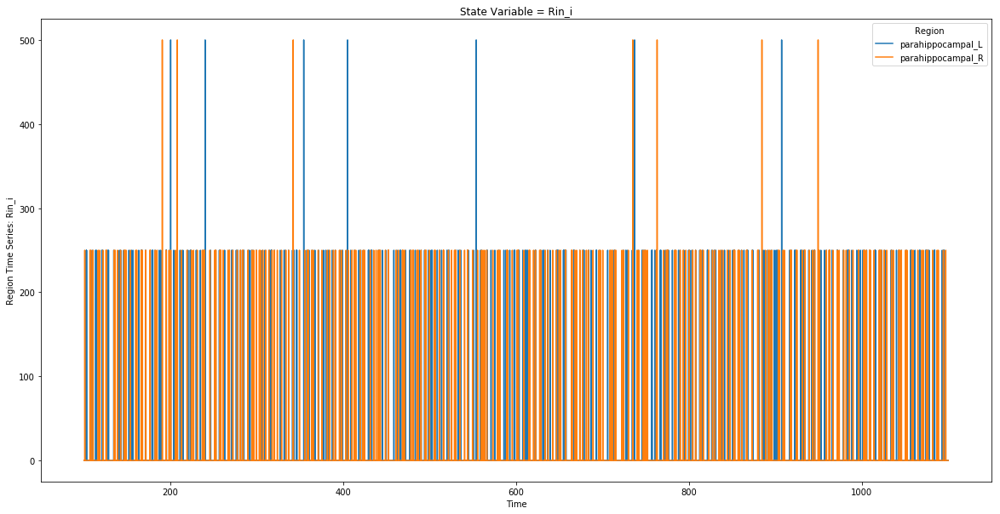

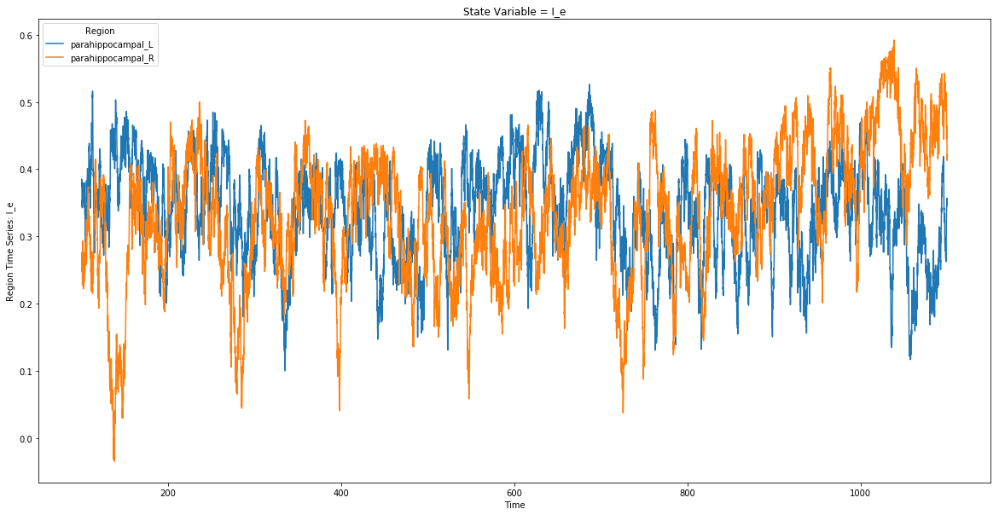

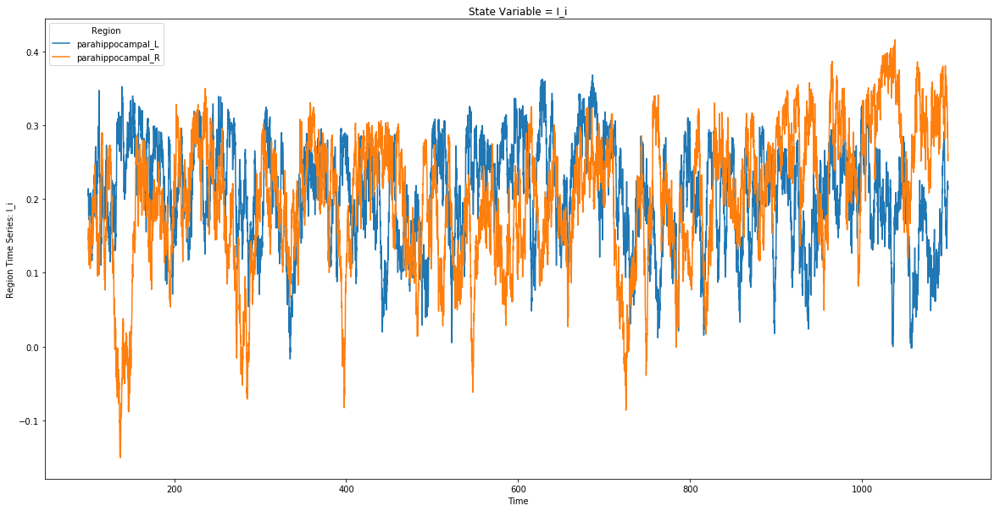

In [22]:
# Focus on the nodes modelled in NEST: 
n_spiking_nodes = len(simulator.tvb_spikeNet_interface.spiking_nodes_ids)
source_ts_nest = source_ts[:, :, simulator.tvb_spikeNet_interface.spiking_nodes_ids]
source_ts_nest.plot_timeseries(plotter_config=plotter.config, per_variable=True, figsize=FIGSIZE,
                               figname="Spiking nodes TVB Time Series");

In [23]:
# # Focus on the nodes modelled in NEST: raster plot
# source_ts_nest.plot_raster(plotter=plotter, per_variable=True, figsize=FIGSIZE,
#                            figname="Spiking nodes TVB Time Series Raster");

### Interactive time series plot

In [24]:
# # ...interactively as well
# # For interactive plotting:
# %matplotlib notebook 
# plotter.plot_timeseries_interactive(source_ts)

### Plot population mean membrane potential time series

In [25]:
# %matplotlib inline 
# # Plot NEST multimeter variables
# # Get continuous state variables from NEST via interfaces to NEST multimeter devices
# # Get them directly as mean field quantities..
# multimeter_mean_data = \
#      TimeSeriesXarray(simulator.tvb_spikeNet_interface.get_mean_data_from_multimeter_to_TVBTimeSeries(),
#                       connectivity=simulator.connectivity)
# if multimeter_mean_data is not None and multimeter_mean_data.size > 0:
#      plotter.plot_multimeter_timeseries(multimeter_mean_data, plot_per_variable=True,
#                                         time_series_class=TimeSeriesXarray, time_series_args={},
#                                         var_pop_join_str=" - ", default_population_label="population",
#                                         figname="NEST region time series");
# if n_spiking_nodes > 3:
#     plotter.plot_multimeter_raster(multimeter_mean_data, plot_per_variable=True,
#                                    time_series_class=TimeSeriesXarray, time_series_args={},
#                                    var_pop_join_str=" - ", default_population_label="population",
#                                    figname="NEST region time series raster");


### Plot spikes' raster and mean spike rate for NEST regions

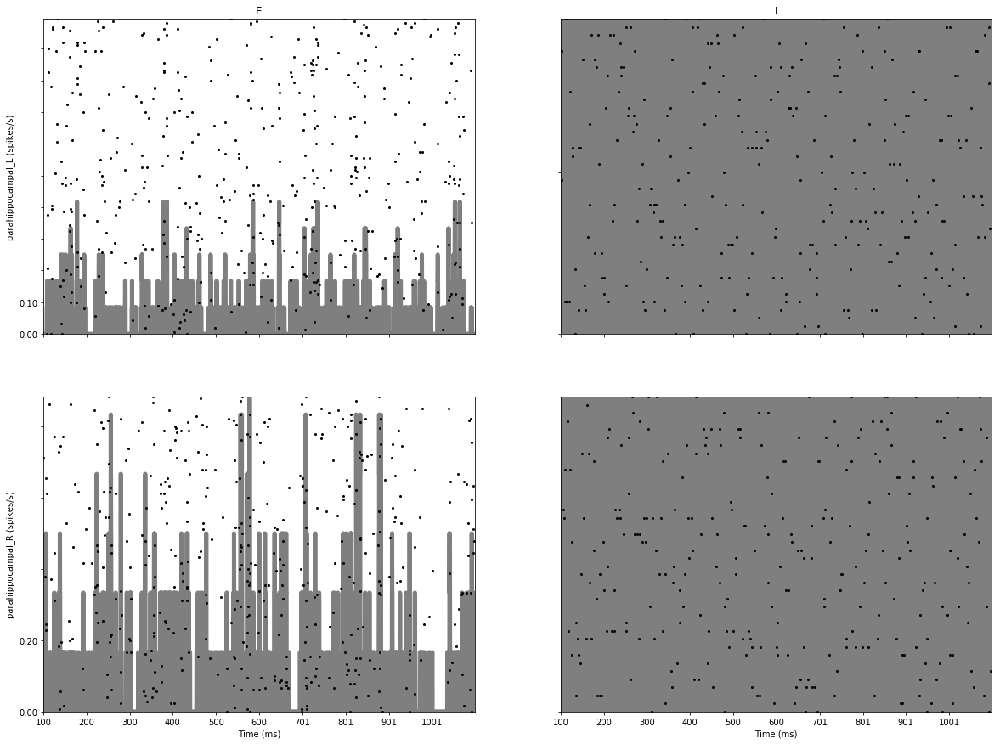

In [26]:
# Plot spikes and mean field spike rates time series
mf_rates_ts, spike_detectors = \
        simulator.tvb_spikeNet_interface.get_mean_spikes_rates_to_TVBTimeSeries(
            spikes_kernel_width=1.0,  # ms
            spikes_kernel_overlap=0.5, time=t)
if spike_detectors is not None and mf_rates_ts.size > 0:
    plotter.plot_spike_detectors(spike_detectors, rates=mf_rates_ts, title='Population spikes and mean spike rate');

### Get per neuron NEST time series and plot them, as well as mean quantities

In [27]:
from xarray import DataArray

spiking_network = simulator.tvb_spikeNet_interface.spiking_network

# Spikes
nest_spikes = spiking_network.get_spikes(mode="events", return_type="Series", exclude_times=exclude_times)
if writer:
    writer.write_object(nest_spikes.to_dict(), path=os.path.join(config.out.FOLDER_RES,  "NEST_Spikes") + ".h5")

# Compute mean spike rates
spike_rates = []
pop_labels = []
population_sizes = [N_E, N_I]
duration = (t[-1] - t[0]) / 1000  # in sec
for i_pop, (pop_label, pop_spikes) in enumerate(nest_spikes.iteritems()):
    pop_labels.append(pop_label)
    spike_rates.append([])
    reg_labels = []
    for reg_label, reg_spikes in pop_spikes.iteritems():
        reg_labels.append(reg_label)
        # rates (spikes/sec) =
        #   total_number_of_spikes (int) / total_time_duration (sec) / total_number_of_neurons_in_pop (int)
        spike_rates[-1].append(len(reg_spikes["times"]) / duration / population_sizes[i_pop])

spike_rates = DataArray(np.array(spike_rates), dims=["Population", "Region"], name="NEST_spike_rates",
                        coords={"Population": pop_labels, "Region": reg_labels})
print(spike_rates)
if writer:
    writer.write_object(spike_rates.to_dict(), path=os.path.join(config.out.FOLDER_RES, spike_rates.name) + ".h5")

<xarray.DataArray 'NEST_spike_rates' (Population: 2, Region: 2)>
array([[2.975  , 2.89375],
       [7.375  , 7.4    ]])
Coordinates:
  * Population  (Population) <U1 'E' 'I'
  * Region      (Region) <U17 'parahippocampal_L' 'parahippocampal_R'


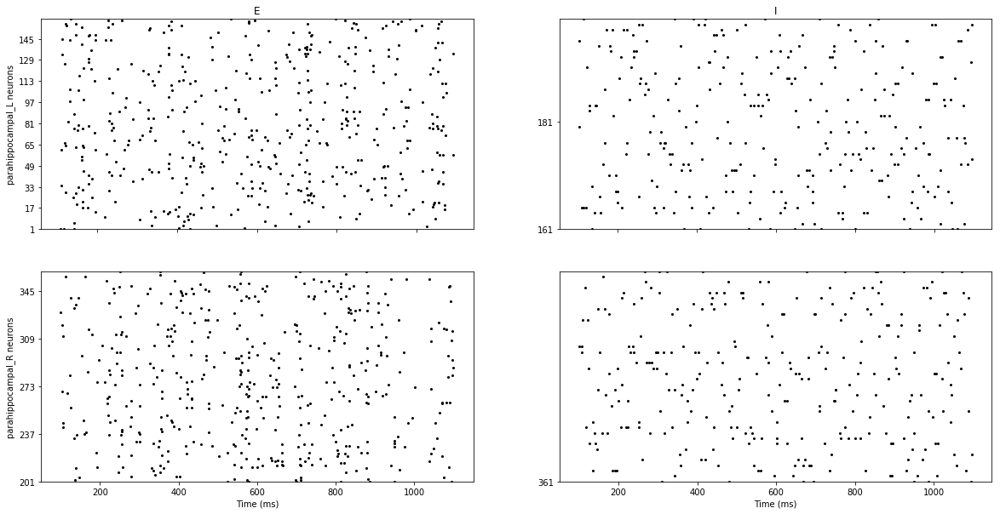

In [28]:
# Plot spikes
plotter.plot_spike_events(nest_spikes, figsize=FIGSIZE);

In [ ]:
from xarray import concat

nest_nodes_ids = tvb_nest_model.spiking_nodes_ids
number_of_regions = simulator.connectivity.number_of_regions

# Time Series
nest_ts = spiking_network.get_data_from_multimeter(mode="per_neuron")
nest_ts = TimeSeriesXarray(nest_ts, connectivity=simulator.connectivity)
if transient:
    nest_ts = nest_ts[transient:]
    
# Compute mean field and group variables together
mean_field = TimeSeriesXarray(nest_ts._data.mean(axis=-1), connectivity=nest_ts.connectivity,
                              title="Mean field spiking nodes time series")
if writer:
    writer.write_tvb_to_h5(TimeSeriesRegion().from_xarray_DataArray(mean_field._data, 
                                                                    connectivity=ts.connectivity),
                           os.path.join(config.out.FOLDER_RES, mean_field.title)+".h5", recursive=False)
    
# We place here all variables that relate to local excitatory synapses
mean_field_exc = mean_field[:, ["spikes_exc", "s_AMPA", "I_AMPA", "x_NMDA", "s_NMDA", "I_NMDA"]]
mean_field_exc._data.name = "Mean excitatory synapse data from NEST multimeter"

# We place here all variables that relate to local inhibitory synapses
mean_field_inh = mean_field[:, ["spikes_inh", "s_GABA", "I_GABA"]]
mean_field_inh._data.name = "Mean inhibitory synapse data from NEST multimeter"

# Substitute the per-region synaptic variables with their sums to reduce outpumean_field:
s_AMPA_ext_nest_nodes = \
    mean_field[:, ['s_AMPA_ext_%d' % node_id for node_id in [0] + nest_nodes_ids]]._data
I_AMPA_ext_nest_nodes = \
    mean_field[:, ['I_AMPA_ext_%d' % node_id for node_id in [0] + nest_nodes_ids]]._data
spikes_exc_ext_nest_nodes = \
    mean_field[:, ['spikes_exc_ext_%d' % node_id for node_id in [0] + nest_nodes_ids]]._data

s_AMPA_ext_tot = \
    mean_field[:, ['s_AMPA_ext_%d' % node_id for node_id in range(number_of_regions)]]. \
           _data.sum(axis=1).expand_dims(axis=1, dim={"Variable": ["s_AMPA_ext_tot"]})
I_AMPA_ext_tot = \
    mean_field[:, ['I_AMPA_ext_%d' % node_id for node_id in range(number_of_regions)]]. \
           _data.sum(axis=1).expand_dims(axis=1, dim={"Variable": ["I_AMPA_ext_tot"]})
spikes_exc_ext_tot = \
    mean_field[:, ['spikes_exc_ext_%d' % node_id for node_id in range(number_of_regions)]]. \
           _data.sum(axis=1).expand_dims(axis=1, dim={"Variable": ["spikes_exc_ext_tot"]})

# We place here all variables that relate to large-scale excitatory synapses
mean_field_ext = TimeSeriesXarray(
    concat([spikes_exc_ext_tot, s_AMPA_ext_tot, I_AMPA_ext_tot,
            spikes_exc_ext_nest_nodes, s_AMPA_ext_nest_nodes, I_AMPA_ext_nest_nodes], "Variable"),
           connectivity=mean_field.connectivity)
mean_field_ext._data.name = "Mean external synapse data from NEST multimeter"

# We place here all variables that refer to all neurons of all populations the same
mean_field_neuron = mean_field[:, ["I_e", "V_m", "I_L"]]
        

In [ ]:
# Plot external synapses mean field time series
mean_field_ext.plot_timeseries(plotter_config=plotter.config, per_variable=True, figsize=FIGSIZE)
if n_spiking_nodes > 3:
    # if spiking nodes are many, plot also a raster plot
    mean_field_ext.plot_raster(plotter_config=plotter.config, per_variable=True, figsize=FIGSIZE)

In [ ]:
# Plot excitatory synapses mean field time series
mean_field_exc.plot_timeseries(plotter_config=plotter.config, per_variable=True, figsize=FIGSIZE)
if n_spiking_nodes > 3:
    # if spiking nodes are many, plot also a raster plot
    mean_field_exc.plot_raster(plotter_config=plotter.config, per_variable=True, figsize=FIGSIZE)

In [ ]:
# Plot inhibitory synapses mean field time series
mean_field_inh.plot_timeseries(plotter_config=plotter.config, per_variable=True, figsize=FIGSIZE)
if n_spiking_nodes > 3:
    # if spiking nodes are many, plot also a raster plot
    mean_field_inh.plot_raster(plotter_config=plotter.config, per_variable=True, figsize=FIGSIZE)
   

In [ ]:
# Plot the rest of the variables' time series
mean_field_neuron.plot_timeseries(plotter_config=plotter.config, per_variable=True, figsize=FIGSIZE)
if n_spiking_nodes > 3:
    # if spiking nodes are many, plot also a raster plot
    mean_field_neuron.plot_raster(plotter_config=plotter.config, per_variable=True, figsize=FIGSIZE)

In [ ]:
# If the spiking nodes are not too many, plot also the time series per neuron
if n_spiking_nodes <= 3:
    dims = nest_ts.labels_ordering
    nest_ts.plot_map(y=dims[4], row=dims[2], col=dims[3], per_variable=True,
                     cmap="jet", figsize=FIGSIZE, plotter_config=plotter.config)

# References

1 Paula Sanz Leon, Stuart A. Knock, M. Marmaduke Woodman, Lia Domide, <br>
  Jochen Mersmann, Anthony R. McIntosh, Viktor Jirsa (2013) <br>
  The Virtual Brain: a simulator of primate brain network dynamics. <br>
  Frontiers in Neuroinformatics (7:10. doi: 10.3389/fninf.2013.00010) <br>
  https://www.thevirtualbrain.org/tvb/zwei <br>
  https://github.com/the-virtual-brain <br>

2 Ritter P, Schirner M, McIntosh AR, Jirsa VK. 2013.  <br>
  The Virtual Brain integrates computational modeling  <br>
  and multimodal neuroimaging. Brain Connectivity 3:121–145. <br>
   
3 Deco Gustavo, Ponce Alvarez Adrian, Dante Mantini, Gian Luca Romani, <br>
  Patric Hagmann and Maurizio Corbetta. <br>
  Resting-State Functional Connectivity Emerges from Structurally and <br>
  Dynamically Shaped Slow Linear Fluctuations. <br>
  The Journal of Neuroscience 32(27), 11239-11252, 2013.<br>

4 Jordan, Jakob; Mørk, Håkon; Vennemo, Stine Brekke;   Terhorst, Dennis; Peyser, <br>
  Alexander; Ippen, Tammo; Deepu, Rajalekshmi;   Eppler, Jochen Martin; <br>
  van Meegen, Alexander;   Kunkel, Susanne; Sinha, Ankur; Fardet, Tanguy; Diaz, <br>
  Sandra; Morrison, Abigail; Schenck, Wolfram; Dahmen, David;   Pronold, Jari; <br>
  Stapmanns, Jonas;   Trensch, Guido; Spreizer, Sebastian;   Mitchell, Jessica; <br>
  Graber, Steffen; Senk, Johanna; Linssen, Charl; Hahne, Jan; Serenko, Alexey; <br>
  Naoumenko, Daniel; Thomson, Eric;   Kitayama, Itaru; Berns, Sebastian;   <br>
  Plesser, Hans Ekkehard <br>
  NEST is a simulator for spiking neural network models that focuses <br>
  on the dynamics, size and structure of neural systems rather than on <br>
  the exact morphology of individual neurons. <br>
  For further information, visit http://www.nest-simulator.org. <br>
  The release notes for this release are available at  <br>
  https://github.com/nest/nest-simulator/releases/tag/v2.18.0 <br>